# 轨道不平整数据挖掘

# 1、数据预处理

## 1.1 读取数据

In [1]:
import pandas as pd                #引入pandas，读取数据
import numpy as np                 #引入numpy，过程运算
import matplotlib.pyplot as plt    #引入matplotlib，绘图显示
import matplotlib

matplotlib.rcParams['font.sans-serif'] = ['FangSong'] # 指定默认字体
matplotlib.rcParams['axes.unicode_minus'] = False    # 解决保存图像是负号'-'显示为方块的问题

original_data = pd.read_csv('original_data.txt',sep=',',encoding='GBK') #加载original_data.txt,指定它的分隔符是\t
original_data.head() #显示数据的前几行
# original_data.tail() #显示数据的后几行

,里程,Meters,Flags,Event,左高低(mm),右高低(mm),左轨向(mm),右轨向(mm),轨距(mm),超高(mm),水平(mm),三角坑(mm),曲率(radpkm),横向加速度(g),垂向加速度(g),速度(km/h),地面标志()
0,60,999.75,40,0,0.02,0.61,-0.44,-0.47,0.63,0.09,-0.99,-0.74,0.0,-0.007,-0.006,147.0,-0.2
1,60,999.50,40,0,-0.17,0.39,-0.50,-0.56,0.62,0.09,-1.08,-0.80,0.0,-0.007,-0.006,148.0,11.7
2,60,999.25,40,0,-0.48,0.19,-0.39,-0.56,0.82,-0.15,-0.80,-1.14,0.0,0.001,-0.000,148.0,3.5
3,60,999.00,40,0,-0.67,0.18,-0.56,-0.71,0.98,-0.15,-0.46,-1.08,0.0,0.001,0.004,148.0,0.9
4,60,998.75,40,0,-0.65,0.07,-0.62,-0.97,1.01,0.96,-0.18,-1.27,0.0,-0.000,0.004,148.0,11.7


In [2]:
# 删除不需要的数据列
del original_data['Flags']
del original_data['Event']
del original_data['超高(mm)']
del original_data['曲率(radpkm)']
del original_data['横向加速度(g)']
del original_data['垂向加速度(g)']
del original_data['速度(km/h)']
del original_data['地面标志()']

index = (original_data['里程']-1)*4000 + original_data['Meters']/0.25
original_data.insert(0,'index',index)

original_data.head() #显示数据的前几行

,index,里程,Meters,左高低(mm),右高低(mm),左轨向(mm),右轨向(mm),轨距(mm),水平(mm),三角坑(mm)
0,239999.0,60,999.75,0.02,0.61,-0.44,-0.47,0.63,-0.99,-0.74
1,239998.0,60,999.50,-0.17,0.39,-0.50,-0.56,0.62,-1.08,-0.80
2,239997.0,60,999.25,-0.48,0.19,-0.39,-0.56,0.82,-0.80,-1.14
3,239996.0,60,999.00,-0.67,0.18,-0.56,-0.71,0.98,-0.46,-1.08
4,239995.0,60,998.75,-0.65,0.07,-0.62,-0.97,1.01,-0.18,-1.27


In [3]:
original_data.tail() #显示数据的后几行

,index,里程,Meters,左高低(mm),右高低(mm),左轨向(mm),右轨向(mm),轨距(mm),水平(mm),三角坑(mm)
240958,4.0,1,1.00,0.99,0.65,0.00,-0.31,1.32,0.43,-1.92
240959,3.0,1,0.75,0.95,0.65,-0.03,-0.19,1.31,0.55,-1.67
240960,2.0,1,0.50,0.86,0.62,-0.06,-0.13,1.33,0.55,-1.51
240961,1.0,1,0.25,0.84,0.60,-0.06,-0.10,1.35,0.49,-1.58
240962,0.0,1,0.00,0.79,0.53,-0.07,-0.12,1.42,0.52,-1.70


## 1.2 将处理后的表格数据保存至二维数组（矩阵）

In [4]:
data = original_data.to_numpy()   # 将数据转换为二维数组形式方便调用
new_data = data[::-1]             # 数据按行反转顺序存储（索引升序排列）

In [5]:
# 显示数据索引（理论上为升序）
new_data[:,0]

array([0.00000e+00, 1.00000e+00, 2.00000e+00, ..., 2.39997e+05,
       2.39998e+05, 2.39999e+05])

## 1.3 数据清洗（样本增补与删减） 

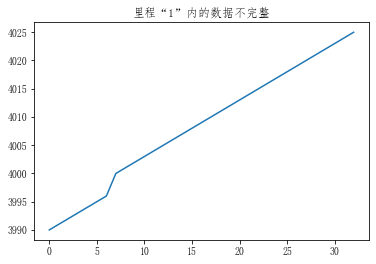

array([3990., 3991., 3992., 3993., 3994., 3995., 3996., 4000., 4001.,
       4002., 4003., 4004., 4005., 4006., 4007., 4008., 4009., 4010.,
       4011., 4012., 4013., 4014., 4015., 4016., 4017., 4018., 4019.,
       4020., 4021., 4022., 4023., 4024., 4025.])

In [6]:
# 显示数据存在异常
plt.plot(new_data[3990:4023,0])
plt.title("里程“1”内的数据不完整")
plt.show()

new_data[3990:4023,0]

In [7]:
# 复制数据到新的变量
use_data = new_data[:]
use_data.shape

(240963, 10)

In [8]:
# 检查所有里程内的数据点是否符合要求
for i in range(1,61):
    number= 0
    
    for m in range(use_data.shape[0]):
        if use_data[m,1] == i:
            number +=1
    
    if number==4000:
        print("The number of " + str(i) + " is " + str(number) + " Right !")
    elif number>=4000:
        print("The number of " + str(i) + " is " + str(number) + " ------------------------- + !")
    elif number<=4000:
        print("The number of " + str(i) + " is " + str(number) + " ------------------------- - !")

The number of 1 is 3997 ------------------------- - !
The number of 2 is 4000 Right !
The number of 3 is 4028 ------------------------- + !
The number of 4 is 4030 ------------------------- + !
The number of 5 is 4011 ------------------------- + !
The number of 6 is 4016 ------------------------- + !
The number of 7 is 4077 ------------------------- + !
The number of 8 is 4037 ------------------------- + !
The number of 9 is 3973 ------------------------- - !
The number of 10 is 3996 ------------------------- - !
The number of 11 is 4000 Right !
The number of 12 is 4063 ------------------------- + !
The number of 13 is 3995 ------------------------- - !
The number of 14 is 3998 ------------------------- - !
The number of 15 is 4000 Right !
The number of 16 is 4015 ------------------------- + !
The number of 17 is 4056 ------------------------- + !
The number of 18 is 4041 ------------------------- + !
The number of 19 is 3954 ------------------------- - !
The number of 20 is 3997 -----

In [9]:
# 补行操作和删重操作
for i in range(240000):
    print(str(i) + " ------------------Operation---------------------")
    zero_padding = np.zeros((1,10),dtype = float)
    if int(use_data[i,0])>i:
        zero_padding[0,0]=i
        zero_padding[0,1]=((i//4000)+1)
        print(zero_padding[0,1])
        use_data = np.insert(use_data,i,zero_padding,axis=0)
        print("增加行并补零处理完成")
    elif int(use_data[i,0])<i:
        use_data = np.delete(use_data,i,axis=0)
        i -= 1
        print("删除重复行操作完成 " + str(i))
    #else:
        #print("无误，继续操作")

0 ------------------Operation---------------------
1 ------------------Operation---------------------
2 ------------------Operation---------------------
3 ------------------Operation---------------------
4 ------------------Operation---------------------
5 ------------------Operation---------------------
6 ------------------Operation---------------------
7 ------------------Operation---------------------
8 ------------------Operation---------------------
9 ------------------Operation---------------------
10 ------------------Operation---------------------
11 ------------------Operation---------------------
12 ------------------Operation---------------------
13 ------------------Operation---------------------
14 ------------------Operation---------------------
15 ------------------Operation---------------------
16 ------------------Operation---------------------
17 ------------------Operation---------------------
18 ------------------Operation---------------------
19 ------------------O

2663 ------------------Operation---------------------
2664 ------------------Operation---------------------
2665 ------------------Operation---------------------
2666 ------------------Operation---------------------
2667 ------------------Operation---------------------
2668 ------------------Operation---------------------
2669 ------------------Operation---------------------
2670 ------------------Operation---------------------
2671 ------------------Operation---------------------
2672 ------------------Operation---------------------
2673 ------------------Operation---------------------
2674 ------------------Operation---------------------
2675 ------------------Operation---------------------
2676 ------------------Operation---------------------
2677 ------------------Operation---------------------
2678 ------------------Operation---------------------
2679 ------------------Operation---------------------
2680 ------------------Operation---------------------
2681 ------------------Opera

5347 ------------------Operation---------------------
5348 ------------------Operation---------------------
5349 ------------------Operation---------------------
5350 ------------------Operation---------------------
5351 ------------------Operation---------------------
5352 ------------------Operation---------------------
5353 ------------------Operation---------------------
5354 ------------------Operation---------------------
5355 ------------------Operation---------------------
5356 ------------------Operation---------------------
5357 ------------------Operation---------------------
5358 ------------------Operation---------------------
5359 ------------------Operation---------------------
5360 ------------------Operation---------------------
5361 ------------------Operation---------------------
5362 ------------------Operation---------------------
5363 ------------------Operation---------------------
5364 ------------------Operation---------------------
5365 ------------------Opera

7846 ------------------Operation---------------------
7847 ------------------Operation---------------------
7848 ------------------Operation---------------------
7849 ------------------Operation---------------------
7850 ------------------Operation---------------------
7851 ------------------Operation---------------------
7852 ------------------Operation---------------------
7853 ------------------Operation---------------------
7854 ------------------Operation---------------------
7855 ------------------Operation---------------------
7856 ------------------Operation---------------------
7857 ------------------Operation---------------------
7858 ------------------Operation---------------------
7859 ------------------Operation---------------------
7860 ------------------Operation---------------------
7861 ------------------Operation---------------------
7862 ------------------Operation---------------------
7863 ------------------Operation---------------------
7864 ------------------Opera

删除重复行操作完成 8049
8051 ------------------Operation---------------------
删除重复行操作完成 8050
8052 ------------------Operation---------------------
删除重复行操作完成 8051
8053 ------------------Operation---------------------
删除重复行操作完成 8052
8054 ------------------Operation---------------------
删除重复行操作完成 8053
8055 ------------------Operation---------------------
删除重复行操作完成 8054
8056 ------------------Operation---------------------
8057 ------------------Operation---------------------
8058 ------------------Operation---------------------
8059 ------------------Operation---------------------
8060 ------------------Operation---------------------
8061 ------------------Operation---------------------
8062 ------------------Operation---------------------
8063 ------------------Operation---------------------
8064 ------------------Operation---------------------
8065 ------------------Operation---------------------
8066 ------------------Operation---------------------
8067 ------------------Operation--------------

10317 ------------------Operation---------------------
10318 ------------------Operation---------------------
10319 ------------------Operation---------------------
10320 ------------------Operation---------------------
10321 ------------------Operation---------------------
10322 ------------------Operation---------------------
10323 ------------------Operation---------------------
10324 ------------------Operation---------------------
10325 ------------------Operation---------------------
10326 ------------------Operation---------------------
10327 ------------------Operation---------------------
10328 ------------------Operation---------------------
10329 ------------------Operation---------------------
10330 ------------------Operation---------------------
10331 ------------------Operation---------------------
10332 ------------------Operation---------------------
10333 ------------------Operation---------------------
10334 ------------------Operation---------------------
10335 ----

删除重复行操作完成 12036
12038 ------------------Operation---------------------
删除重复行操作完成 12037
12039 ------------------Operation---------------------
删除重复行操作完成 12038
12040 ------------------Operation---------------------
删除重复行操作完成 12039
12041 ------------------Operation---------------------
删除重复行操作完成 12040
12042 ------------------Operation---------------------
删除重复行操作完成 12041
12043 ------------------Operation---------------------
删除重复行操作完成 12042
12044 ------------------Operation---------------------
删除重复行操作完成 12043
12045 ------------------Operation---------------------
删除重复行操作完成 12044
12046 ------------------Operation---------------------
删除重复行操作完成 12045
12047 ------------------Operation---------------------
删除重复行操作完成 12046
12048 ------------------Operation---------------------
删除重复行操作完成 12047
12049 ------------------Operation---------------------
删除重复行操作完成 12048
12050 ------------------Operation---------------------
删除重复行操作完成 12049
12051 ------------------Operation---------------------
删除重复行操

13156 ------------------Operation---------------------
13157 ------------------Operation---------------------
13158 ------------------Operation---------------------
13159 ------------------Operation---------------------
13160 ------------------Operation---------------------
13161 ------------------Operation---------------------
13162 ------------------Operation---------------------
13163 ------------------Operation---------------------
13164 ------------------Operation---------------------
13165 ------------------Operation---------------------
13166 ------------------Operation---------------------
13167 ------------------Operation---------------------
13168 ------------------Operation---------------------
13169 ------------------Operation---------------------
13170 ------------------Operation---------------------
13171 ------------------Operation---------------------
13172 ------------------Operation---------------------
13173 ------------------Operation---------------------
13174 ----

15504 ------------------Operation---------------------
15505 ------------------Operation---------------------
15506 ------------------Operation---------------------
15507 ------------------Operation---------------------
15508 ------------------Operation---------------------
15509 ------------------Operation---------------------
15510 ------------------Operation---------------------
15511 ------------------Operation---------------------
15512 ------------------Operation---------------------
15513 ------------------Operation---------------------
15514 ------------------Operation---------------------
15515 ------------------Operation---------------------
15516 ------------------Operation---------------------
15517 ------------------Operation---------------------
15518 ------------------Operation---------------------
15519 ------------------Operation---------------------
15520 ------------------Operation---------------------
15521 ------------------Operation---------------------
15522 ----

17274 ------------------Operation---------------------
17275 ------------------Operation---------------------
17276 ------------------Operation---------------------
17277 ------------------Operation---------------------
17278 ------------------Operation---------------------
17279 ------------------Operation---------------------
17280 ------------------Operation---------------------
17281 ------------------Operation---------------------
17282 ------------------Operation---------------------
17283 ------------------Operation---------------------
17284 ------------------Operation---------------------
17285 ------------------Operation---------------------
17286 ------------------Operation---------------------
17287 ------------------Operation---------------------
17288 ------------------Operation---------------------
17289 ------------------Operation---------------------
17290 ------------------Operation---------------------
17291 ------------------Operation---------------------
17292 ----

19590 ------------------Operation---------------------
19591 ------------------Operation---------------------
19592 ------------------Operation---------------------
19593 ------------------Operation---------------------
19594 ------------------Operation---------------------
19595 ------------------Operation---------------------
19596 ------------------Operation---------------------
19597 ------------------Operation---------------------
19598 ------------------Operation---------------------
19599 ------------------Operation---------------------
19600 ------------------Operation---------------------
19601 ------------------Operation---------------------
19602 ------------------Operation---------------------
19603 ------------------Operation---------------------
19604 ------------------Operation---------------------
19605 ------------------Operation---------------------
19606 ------------------Operation---------------------
19607 ------------------Operation---------------------
19608 ----

21257 ------------------Operation---------------------
21258 ------------------Operation---------------------
21259 ------------------Operation---------------------
21260 ------------------Operation---------------------
21261 ------------------Operation---------------------
21262 ------------------Operation---------------------
21263 ------------------Operation---------------------
21264 ------------------Operation---------------------
21265 ------------------Operation---------------------
21266 ------------------Operation---------------------
21267 ------------------Operation---------------------
21268 ------------------Operation---------------------
21269 ------------------Operation---------------------
21270 ------------------Operation---------------------
21271 ------------------Operation---------------------
21272 ------------------Operation---------------------
21273 ------------------Operation---------------------
21274 ------------------Operation---------------------
21275 ----

24017 ------------------Operation---------------------
24018 ------------------Operation---------------------
24019 ------------------Operation---------------------
24020 ------------------Operation---------------------
24021 ------------------Operation---------------------
24022 ------------------Operation---------------------
24023 ------------------Operation---------------------
24024 ------------------Operation---------------------
24025 ------------------Operation---------------------
24026 ------------------Operation---------------------
24027 ------------------Operation---------------------
24028 ------------------Operation---------------------
24029 ------------------Operation---------------------
24030 ------------------Operation---------------------
24031 ------------------Operation---------------------
24032 ------------------Operation---------------------
24033 ------------------Operation---------------------
24034 ------------------Operation---------------------
24035 ----

24466 ------------------Operation---------------------
24467 ------------------Operation---------------------
24468 ------------------Operation---------------------
24469 ------------------Operation---------------------
24470 ------------------Operation---------------------
24471 ------------------Operation---------------------
24472 ------------------Operation---------------------
24473 ------------------Operation---------------------
24474 ------------------Operation---------------------
24475 ------------------Operation---------------------
24476 ------------------Operation---------------------
24477 ------------------Operation---------------------
24478 ------------------Operation---------------------
24479 ------------------Operation---------------------
24480 ------------------Operation---------------------
24481 ------------------Operation---------------------
24482 ------------------Operation---------------------
24483 ------------------Operation---------------------
24484 ----

27137 ------------------Operation---------------------
27138 ------------------Operation---------------------
27139 ------------------Operation---------------------
27140 ------------------Operation---------------------
27141 ------------------Operation---------------------
27142 ------------------Operation---------------------
27143 ------------------Operation---------------------
27144 ------------------Operation---------------------
27145 ------------------Operation---------------------
27146 ------------------Operation---------------------
27147 ------------------Operation---------------------
27148 ------------------Operation---------------------
27149 ------------------Operation---------------------
27150 ------------------Operation---------------------
27151 ------------------Operation---------------------
27152 ------------------Operation---------------------
27153 ------------------Operation---------------------
27154 ------------------Operation---------------------
27155 ----

删除重复行操作完成 28055
28057 ------------------Operation---------------------
删除重复行操作完成 28056
28058 ------------------Operation---------------------
删除重复行操作完成 28057
28059 ------------------Operation---------------------
删除重复行操作完成 28058
28060 ------------------Operation---------------------
删除重复行操作完成 28059
28061 ------------------Operation---------------------
删除重复行操作完成 28060
28062 ------------------Operation---------------------
删除重复行操作完成 28061
28063 ------------------Operation---------------------
删除重复行操作完成 28062
28064 ------------------Operation---------------------
删除重复行操作完成 28063
28065 ------------------Operation---------------------
删除重复行操作完成 28064
28066 ------------------Operation---------------------
删除重复行操作完成 28065
28067 ------------------Operation---------------------
删除重复行操作完成 28066
28068 ------------------Operation---------------------
删除重复行操作完成 28067
28069 ------------------Operation---------------------
删除重复行操作完成 28068
28070 ------------------Operation---------------------
删除重复行操

29258 ------------------Operation---------------------
29259 ------------------Operation---------------------
29260 ------------------Operation---------------------
29261 ------------------Operation---------------------
29262 ------------------Operation---------------------
29263 ------------------Operation---------------------
29264 ------------------Operation---------------------
29265 ------------------Operation---------------------
29266 ------------------Operation---------------------
29267 ------------------Operation---------------------
29268 ------------------Operation---------------------
29269 ------------------Operation---------------------
29270 ------------------Operation---------------------
29271 ------------------Operation---------------------
29272 ------------------Operation---------------------
29273 ------------------Operation---------------------
29274 ------------------Operation---------------------
29275 ------------------Operation---------------------
29276 ----

31640 ------------------Operation---------------------
31641 ------------------Operation---------------------
31642 ------------------Operation---------------------
31643 ------------------Operation---------------------
31644 ------------------Operation---------------------
31645 ------------------Operation---------------------
31646 ------------------Operation---------------------
31647 ------------------Operation---------------------
31648 ------------------Operation---------------------
31649 ------------------Operation---------------------
31650 ------------------Operation---------------------
31651 ------------------Operation---------------------
31652 ------------------Operation---------------------
31653 ------------------Operation---------------------
31654 ------------------Operation---------------------
31655 ------------------Operation---------------------
31656 ------------------Operation---------------------
31657 ------------------Operation---------------------
31658 ----

33121 ------------------Operation---------------------
33122 ------------------Operation---------------------
33123 ------------------Operation---------------------
33124 ------------------Operation---------------------
33125 ------------------Operation---------------------
33126 ------------------Operation---------------------
33127 ------------------Operation---------------------
33128 ------------------Operation---------------------
33129 ------------------Operation---------------------
33130 ------------------Operation---------------------
33131 ------------------Operation---------------------
33132 ------------------Operation---------------------
33133 ------------------Operation---------------------
33134 ------------------Operation---------------------
33135 ------------------Operation---------------------
33136 ------------------Operation---------------------
33137 ------------------Operation---------------------
33138 ------------------Operation---------------------
33139 ----

35620 ------------------Operation---------------------
35621 ------------------Operation---------------------
35622 ------------------Operation---------------------
35623 ------------------Operation---------------------
35624 ------------------Operation---------------------
35625 ------------------Operation---------------------
35626 ------------------Operation---------------------
35627 ------------------Operation---------------------
35628 ------------------Operation---------------------
35629 ------------------Operation---------------------
35630 ------------------Operation---------------------
35631 ------------------Operation---------------------
35632 ------------------Operation---------------------
35633 ------------------Operation---------------------
35634 ------------------Operation---------------------
35635 ------------------Operation---------------------
35636 ------------------Operation---------------------
35637 ------------------Operation---------------------
35638 ----

增加行并补零处理完成
35980 ------------------Operation---------------------
9.0
增加行并补零处理完成
35981 ------------------Operation---------------------
9.0
增加行并补零处理完成
35982 ------------------Operation---------------------
9.0
增加行并补零处理完成
35983 ------------------Operation---------------------
9.0
增加行并补零处理完成
35984 ------------------Operation---------------------
9.0
增加行并补零处理完成
35985 ------------------Operation---------------------
9.0
增加行并补零处理完成
35986 ------------------Operation---------------------
9.0
增加行并补零处理完成
35987 ------------------Operation---------------------
9.0
增加行并补零处理完成
35988 ------------------Operation---------------------
9.0
增加行并补零处理完成
35989 ------------------Operation---------------------
9.0
增加行并补零处理完成
35990 ------------------Operation---------------------
9.0
增加行并补零处理完成
35991 ------------------Operation---------------------
9.0
增加行并补零处理完成
35992 ------------------Operation---------------------
9.0
增加行并补零处理完成
35993 ------------------Operation---------------------
9.0
增加行并补零处理完成
35994 ---

37029 ------------------Operation---------------------
37030 ------------------Operation---------------------
37031 ------------------Operation---------------------
37032 ------------------Operation---------------------
37033 ------------------Operation---------------------
37034 ------------------Operation---------------------
37035 ------------------Operation---------------------
37036 ------------------Operation---------------------
37037 ------------------Operation---------------------
37038 ------------------Operation---------------------
37039 ------------------Operation---------------------
37040 ------------------Operation---------------------
37041 ------------------Operation---------------------
37042 ------------------Operation---------------------
37043 ------------------Operation---------------------
37044 ------------------Operation---------------------
37045 ------------------Operation---------------------
37046 ------------------Operation---------------------
37047 ----

39073 ------------------Operation---------------------
39074 ------------------Operation---------------------
39075 ------------------Operation---------------------
39076 ------------------Operation---------------------
39077 ------------------Operation---------------------
39078 ------------------Operation---------------------
39079 ------------------Operation---------------------
39080 ------------------Operation---------------------
39081 ------------------Operation---------------------
39082 ------------------Operation---------------------
39083 ------------------Operation---------------------
39084 ------------------Operation---------------------
39085 ------------------Operation---------------------
39086 ------------------Operation---------------------
39087 ------------------Operation---------------------
39088 ------------------Operation---------------------
39089 ------------------Operation---------------------
39090 ------------------Operation---------------------
39091 ----

41138 ------------------Operation---------------------
41139 ------------------Operation---------------------
41140 ------------------Operation---------------------
41141 ------------------Operation---------------------
41142 ------------------Operation---------------------
41143 ------------------Operation---------------------
41144 ------------------Operation---------------------
41145 ------------------Operation---------------------
41146 ------------------Operation---------------------
41147 ------------------Operation---------------------
41148 ------------------Operation---------------------
41149 ------------------Operation---------------------
41150 ------------------Operation---------------------
41151 ------------------Operation---------------------
41152 ------------------Operation---------------------
41153 ------------------Operation---------------------
41154 ------------------Operation---------------------
41155 ------------------Operation---------------------
41156 ----

42974 ------------------Operation---------------------
42975 ------------------Operation---------------------
42976 ------------------Operation---------------------
42977 ------------------Operation---------------------
42978 ------------------Operation---------------------
42979 ------------------Operation---------------------
42980 ------------------Operation---------------------
42981 ------------------Operation---------------------
42982 ------------------Operation---------------------
42983 ------------------Operation---------------------
42984 ------------------Operation---------------------
42985 ------------------Operation---------------------
42986 ------------------Operation---------------------
42987 ------------------Operation---------------------
42988 ------------------Operation---------------------
42989 ------------------Operation---------------------
42990 ------------------Operation---------------------
42991 ------------------Operation---------------------
42992 ----

删除重复行操作完成 44077
44079 ------------------Operation---------------------
删除重复行操作完成 44078
44080 ------------------Operation---------------------
删除重复行操作完成 44079
44081 ------------------Operation---------------------
删除重复行操作完成 44080
44082 ------------------Operation---------------------
删除重复行操作完成 44081
44083 ------------------Operation---------------------
删除重复行操作完成 44082
44084 ------------------Operation---------------------
删除重复行操作完成 44083
44085 ------------------Operation---------------------
删除重复行操作完成 44084
44086 ------------------Operation---------------------
删除重复行操作完成 44085
44087 ------------------Operation---------------------
删除重复行操作完成 44086
44088 ------------------Operation---------------------
删除重复行操作完成 44087
44089 ------------------Operation---------------------
删除重复行操作完成 44088
44090 ------------------Operation---------------------
删除重复行操作完成 44089
44091 ------------------Operation---------------------
删除重复行操作完成 44090
44092 ------------------Operation---------------------
删除重复行操

44417 ------------------Operation---------------------
44418 ------------------Operation---------------------
44419 ------------------Operation---------------------
44420 ------------------Operation---------------------
44421 ------------------Operation---------------------
44422 ------------------Operation---------------------
44423 ------------------Operation---------------------
44424 ------------------Operation---------------------
44425 ------------------Operation---------------------
44426 ------------------Operation---------------------
44427 ------------------Operation---------------------
44428 ------------------Operation---------------------
44429 ------------------Operation---------------------
44430 ------------------Operation---------------------
44431 ------------------Operation---------------------
44432 ------------------Operation---------------------
44433 ------------------Operation---------------------
44434 ------------------Operation---------------------
44435 ----

46455 ------------------Operation---------------------
46456 ------------------Operation---------------------
46457 ------------------Operation---------------------
46458 ------------------Operation---------------------
46459 ------------------Operation---------------------
46460 ------------------Operation---------------------
46461 ------------------Operation---------------------
46462 ------------------Operation---------------------
46463 ------------------Operation---------------------
46464 ------------------Operation---------------------
46465 ------------------Operation---------------------
46466 ------------------Operation---------------------
46467 ------------------Operation---------------------
46468 ------------------Operation---------------------
46469 ------------------Operation---------------------
46470 ------------------Operation---------------------
46471 ------------------Operation---------------------
46472 ------------------Operation---------------------
46473 ----

删除重复行操作完成 48023
48025 ------------------Operation---------------------
删除重复行操作完成 48024
48026 ------------------Operation---------------------
删除重复行操作完成 48025
48027 ------------------Operation---------------------
删除重复行操作完成 48026
48028 ------------------Operation---------------------
删除重复行操作完成 48027
48029 ------------------Operation---------------------
删除重复行操作完成 48028
48030 ------------------Operation---------------------
删除重复行操作完成 48029
48031 ------------------Operation---------------------
删除重复行操作完成 48030
48032 ------------------Operation---------------------
删除重复行操作完成 48031
48033 ------------------Operation---------------------
删除重复行操作完成 48032
48034 ------------------Operation---------------------
删除重复行操作完成 48033
48035 ------------------Operation---------------------
删除重复行操作完成 48034
48036 ------------------Operation---------------------
删除重复行操作完成 48035
48037 ------------------Operation---------------------
删除重复行操作完成 48036
48038 ------------------Operation---------------------
48039 

49010 ------------------Operation---------------------
49011 ------------------Operation---------------------
49012 ------------------Operation---------------------
49013 ------------------Operation---------------------
49014 ------------------Operation---------------------
49015 ------------------Operation---------------------
49016 ------------------Operation---------------------
49017 ------------------Operation---------------------
49018 ------------------Operation---------------------
49019 ------------------Operation---------------------
49020 ------------------Operation---------------------
49021 ------------------Operation---------------------
49022 ------------------Operation---------------------
49023 ------------------Operation---------------------
49024 ------------------Operation---------------------
49025 ------------------Operation---------------------
49026 ------------------Operation---------------------
49027 ------------------Operation---------------------
49028 ----

50734 ------------------Operation---------------------
50735 ------------------Operation---------------------
50736 ------------------Operation---------------------
50737 ------------------Operation---------------------
50738 ------------------Operation---------------------
50739 ------------------Operation---------------------
50740 ------------------Operation---------------------
50741 ------------------Operation---------------------
50742 ------------------Operation---------------------
50743 ------------------Operation---------------------
50744 ------------------Operation---------------------
50745 ------------------Operation---------------------
50746 ------------------Operation---------------------
50747 ------------------Operation---------------------
50748 ------------------Operation---------------------
50749 ------------------Operation---------------------
50750 ------------------Operation---------------------
50751 ------------------Operation---------------------
50752 ----

增加行并补零处理完成
51985 ------------------Operation---------------------
13.0
增加行并补零处理完成
51986 ------------------Operation---------------------
13.0
增加行并补零处理完成
51987 ------------------Operation---------------------
13.0
增加行并补零处理完成
51988 ------------------Operation---------------------
13.0
增加行并补零处理完成
51989 ------------------Operation---------------------
13.0
增加行并补零处理完成
51990 ------------------Operation---------------------
13.0
增加行并补零处理完成
51991 ------------------Operation---------------------
13.0
增加行并补零处理完成
51992 ------------------Operation---------------------
13.0
增加行并补零处理完成
51993 ------------------Operation---------------------
13.0
增加行并补零处理完成
51994 ------------------Operation---------------------
13.0
增加行并补零处理完成
51995 ------------------Operation---------------------
13.0
增加行并补零处理完成
51996 ------------------Operation---------------------
13.0
增加行并补零处理完成
51997 ------------------Operation---------------------
13.0
增加行并补零处理完成
51998 ------------------Operation---------------------
13.0
增加行并补零

52981 ------------------Operation---------------------
52982 ------------------Operation---------------------
52983 ------------------Operation---------------------
52984 ------------------Operation---------------------
52985 ------------------Operation---------------------
52986 ------------------Operation---------------------
52987 ------------------Operation---------------------
52988 ------------------Operation---------------------
52989 ------------------Operation---------------------
52990 ------------------Operation---------------------
52991 ------------------Operation---------------------
52992 ------------------Operation---------------------
52993 ------------------Operation---------------------
52994 ------------------Operation---------------------
52995 ------------------Operation---------------------
52996 ------------------Operation---------------------
52997 ------------------Operation---------------------
52998 ------------------Operation---------------------
52999 ----

54742 ------------------Operation---------------------
54743 ------------------Operation---------------------
54744 ------------------Operation---------------------
54745 ------------------Operation---------------------
54746 ------------------Operation---------------------
54747 ------------------Operation---------------------
54748 ------------------Operation---------------------
54749 ------------------Operation---------------------
54750 ------------------Operation---------------------
54751 ------------------Operation---------------------
54752 ------------------Operation---------------------
54753 ------------------Operation---------------------
54754 ------------------Operation---------------------
54755 ------------------Operation---------------------
54756 ------------------Operation---------------------
54757 ------------------Operation---------------------
54758 ------------------Operation---------------------
54759 ------------------Operation---------------------
54760 ----

56844 ------------------Operation---------------------
56845 ------------------Operation---------------------
56846 ------------------Operation---------------------
56847 ------------------Operation---------------------
56848 ------------------Operation---------------------
56849 ------------------Operation---------------------
56850 ------------------Operation---------------------
56851 ------------------Operation---------------------
56852 ------------------Operation---------------------
56853 ------------------Operation---------------------
56854 ------------------Operation---------------------
56855 ------------------Operation---------------------
56856 ------------------Operation---------------------
56857 ------------------Operation---------------------
56858 ------------------Operation---------------------
56859 ------------------Operation---------------------
56860 ------------------Operation---------------------
56861 ------------------Operation---------------------
56862 ----

58380 ------------------Operation---------------------
58381 ------------------Operation---------------------
58382 ------------------Operation---------------------
58383 ------------------Operation---------------------
58384 ------------------Operation---------------------
58385 ------------------Operation---------------------
58386 ------------------Operation---------------------
58387 ------------------Operation---------------------
58388 ------------------Operation---------------------
58389 ------------------Operation---------------------
58390 ------------------Operation---------------------
58391 ------------------Operation---------------------
58392 ------------------Operation---------------------
58393 ------------------Operation---------------------
58394 ------------------Operation---------------------
58395 ------------------Operation---------------------
58396 ------------------Operation---------------------
58397 ------------------Operation---------------------
58398 ----

删除重复行操作完成 60016
60018 ------------------Operation---------------------
删除重复行操作完成 60017
60019 ------------------Operation---------------------
删除重复行操作完成 60018
60020 ------------------Operation---------------------
删除重复行操作完成 60019
60021 ------------------Operation---------------------
删除重复行操作完成 60020
60022 ------------------Operation---------------------
删除重复行操作完成 60021
60023 ------------------Operation---------------------
删除重复行操作完成 60022
60024 ------------------Operation---------------------
删除重复行操作完成 60023
60025 ------------------Operation---------------------
删除重复行操作完成 60024
60026 ------------------Operation---------------------
删除重复行操作完成 60025
60027 ------------------Operation---------------------
删除重复行操作完成 60026
60028 ------------------Operation---------------------
删除重复行操作完成 60027
60029 ------------------Operation---------------------
删除重复行操作完成 60028
60030 ------------------Operation---------------------
60031 ------------------Operation---------------------
60032 ----------------

61364 ------------------Operation---------------------
61365 ------------------Operation---------------------
61366 ------------------Operation---------------------
61367 ------------------Operation---------------------
61368 ------------------Operation---------------------
61369 ------------------Operation---------------------
61370 ------------------Operation---------------------
61371 ------------------Operation---------------------
61372 ------------------Operation---------------------
61373 ------------------Operation---------------------
61374 ------------------Operation---------------------
61375 ------------------Operation---------------------
61376 ------------------Operation---------------------
61377 ------------------Operation---------------------
61378 ------------------Operation---------------------
61379 ------------------Operation---------------------
61380 ------------------Operation---------------------
61381 ------------------Operation---------------------
61382 ----

63363 ------------------Operation---------------------
63364 ------------------Operation---------------------
63365 ------------------Operation---------------------
63366 ------------------Operation---------------------
63367 ------------------Operation---------------------
63368 ------------------Operation---------------------
63369 ------------------Operation---------------------
63370 ------------------Operation---------------------
63371 ------------------Operation---------------------
63372 ------------------Operation---------------------
63373 ------------------Operation---------------------
63374 ------------------Operation---------------------
63375 ------------------Operation---------------------
63376 ------------------Operation---------------------
63377 ------------------Operation---------------------
63378 ------------------Operation---------------------
63379 ------------------Operation---------------------
63380 ------------------Operation---------------------
63381 ----

删除重复行操作完成 64071
64073 ------------------Operation---------------------
删除重复行操作完成 64072
64074 ------------------Operation---------------------
删除重复行操作完成 64073
64075 ------------------Operation---------------------
删除重复行操作完成 64074
64076 ------------------Operation---------------------
删除重复行操作完成 64075
64077 ------------------Operation---------------------
删除重复行操作完成 64076
64078 ------------------Operation---------------------
删除重复行操作完成 64077
64079 ------------------Operation---------------------
删除重复行操作完成 64078
64080 ------------------Operation---------------------
删除重复行操作完成 64079
64081 ------------------Operation---------------------
删除重复行操作完成 64080
64082 ------------------Operation---------------------
删除重复行操作完成 64081
64083 ------------------Operation---------------------
删除重复行操作完成 64082
64084 ------------------Operation---------------------
删除重复行操作完成 64083
64085 ------------------Operation---------------------
删除重复行操作完成 64084
64086 ------------------Operation---------------------
删除重复行操

65306 ------------------Operation---------------------
65307 ------------------Operation---------------------
65308 ------------------Operation---------------------
65309 ------------------Operation---------------------
65310 ------------------Operation---------------------
65311 ------------------Operation---------------------
65312 ------------------Operation---------------------
65313 ------------------Operation---------------------
65314 ------------------Operation---------------------
65315 ------------------Operation---------------------
65316 ------------------Operation---------------------
65317 ------------------Operation---------------------
65318 ------------------Operation---------------------
65319 ------------------Operation---------------------
65320 ------------------Operation---------------------
65321 ------------------Operation---------------------
65322 ------------------Operation---------------------
65323 ------------------Operation---------------------
65324 ----

66824 ------------------Operation---------------------
66825 ------------------Operation---------------------
66826 ------------------Operation---------------------
66827 ------------------Operation---------------------
66828 ------------------Operation---------------------
66829 ------------------Operation---------------------
66830 ------------------Operation---------------------
66831 ------------------Operation---------------------
66832 ------------------Operation---------------------
66833 ------------------Operation---------------------
66834 ------------------Operation---------------------
66835 ------------------Operation---------------------
66836 ------------------Operation---------------------
66837 ------------------Operation---------------------
66838 ------------------Operation---------------------
66839 ------------------Operation---------------------
66840 ------------------Operation---------------------
66841 ------------------Operation---------------------
66842 ----

删除重复行操作完成 68052
68054 ------------------Operation---------------------
删除重复行操作完成 68053
68055 ------------------Operation---------------------
删除重复行操作完成 68054
68056 ------------------Operation---------------------
删除重复行操作完成 68055
68057 ------------------Operation---------------------
删除重复行操作完成 68056
68058 ------------------Operation---------------------
删除重复行操作完成 68057
68059 ------------------Operation---------------------
删除重复行操作完成 68058
68060 ------------------Operation---------------------
删除重复行操作完成 68059
68061 ------------------Operation---------------------
删除重复行操作完成 68060
68062 ------------------Operation---------------------
删除重复行操作完成 68061
68063 ------------------Operation---------------------
删除重复行操作完成 68062
68064 ------------------Operation---------------------
删除重复行操作完成 68063
68065 ------------------Operation---------------------
删除重复行操作完成 68064
68066 ------------------Operation---------------------
删除重复行操作完成 68065
68067 ------------------Operation---------------------
删除重复行操

69763 ------------------Operation---------------------
69764 ------------------Operation---------------------
69765 ------------------Operation---------------------
69766 ------------------Operation---------------------
69767 ------------------Operation---------------------
69768 ------------------Operation---------------------
69769 ------------------Operation---------------------
69770 ------------------Operation---------------------
69771 ------------------Operation---------------------
69772 ------------------Operation---------------------
69773 ------------------Operation---------------------
69774 ------------------Operation---------------------
69775 ------------------Operation---------------------
69776 ------------------Operation---------------------
69777 ------------------Operation---------------------
69778 ------------------Operation---------------------
69779 ------------------Operation---------------------
69780 ------------------Operation---------------------
69781 ----

71881 ------------------Operation---------------------
71882 ------------------Operation---------------------
71883 ------------------Operation---------------------
71884 ------------------Operation---------------------
71885 ------------------Operation---------------------
71886 ------------------Operation---------------------
71887 ------------------Operation---------------------
71888 ------------------Operation---------------------
71889 ------------------Operation---------------------
71890 ------------------Operation---------------------
71891 ------------------Operation---------------------
71892 ------------------Operation---------------------
71893 ------------------Operation---------------------
71894 ------------------Operation---------------------
71895 ------------------Operation---------------------
71896 ------------------Operation---------------------
71897 ------------------Operation---------------------
71898 ------------------Operation---------------------
71899 ----

73253 ------------------Operation---------------------
73254 ------------------Operation---------------------
73255 ------------------Operation---------------------
73256 ------------------Operation---------------------
73257 ------------------Operation---------------------
73258 ------------------Operation---------------------
73259 ------------------Operation---------------------
73260 ------------------Operation---------------------
73261 ------------------Operation---------------------
73262 ------------------Operation---------------------
73263 ------------------Operation---------------------
73264 ------------------Operation---------------------
73265 ------------------Operation---------------------
73266 ------------------Operation---------------------
73267 ------------------Operation---------------------
73268 ------------------Operation---------------------
73269 ------------------Operation---------------------
73270 ------------------Operation---------------------
73271 ----

75202 ------------------Operation---------------------
75203 ------------------Operation---------------------
75204 ------------------Operation---------------------
75205 ------------------Operation---------------------
75206 ------------------Operation---------------------
75207 ------------------Operation---------------------
75208 ------------------Operation---------------------
75209 ------------------Operation---------------------
75210 ------------------Operation---------------------
75211 ------------------Operation---------------------
75212 ------------------Operation---------------------
75213 ------------------Operation---------------------
75214 ------------------Operation---------------------
75215 ------------------Operation---------------------
75216 ------------------Operation---------------------
75217 ------------------Operation---------------------
75218 ------------------Operation---------------------
75219 ------------------Operation---------------------
75220 ----

增加行并补零处理完成
75959 ------------------Operation---------------------
19.0
增加行并补零处理完成
75960 ------------------Operation---------------------
19.0
增加行并补零处理完成
75961 ------------------Operation---------------------
19.0
增加行并补零处理完成
75962 ------------------Operation---------------------
19.0
增加行并补零处理完成
75963 ------------------Operation---------------------
19.0
增加行并补零处理完成
75964 ------------------Operation---------------------
19.0
增加行并补零处理完成
75965 ------------------Operation---------------------
19.0
增加行并补零处理完成
75966 ------------------Operation---------------------
19.0
增加行并补零处理完成
75967 ------------------Operation---------------------
19.0
增加行并补零处理完成
75968 ------------------Operation---------------------
19.0
增加行并补零处理完成
75969 ------------------Operation---------------------
19.0
增加行并补零处理完成
75970 ------------------Operation---------------------
19.0
增加行并补零处理完成
75971 ------------------Operation---------------------
19.0
增加行并补零处理完成
75972 ------------------Operation---------------------
19.0
增加行并补零

77141 ------------------Operation---------------------
77142 ------------------Operation---------------------
77143 ------------------Operation---------------------
77144 ------------------Operation---------------------
77145 ------------------Operation---------------------
77146 ------------------Operation---------------------
77147 ------------------Operation---------------------
77148 ------------------Operation---------------------
77149 ------------------Operation---------------------
77150 ------------------Operation---------------------
77151 ------------------Operation---------------------
77152 ------------------Operation---------------------
77153 ------------------Operation---------------------
77154 ------------------Operation---------------------
77155 ------------------Operation---------------------
77156 ------------------Operation---------------------
77157 ------------------Operation---------------------
77158 ------------------Operation---------------------
77159 ----

79140 ------------------Operation---------------------
79141 ------------------Operation---------------------
79142 ------------------Operation---------------------
79143 ------------------Operation---------------------
79144 ------------------Operation---------------------
79145 ------------------Operation---------------------
79146 ------------------Operation---------------------
79147 ------------------Operation---------------------
79148 ------------------Operation---------------------
79149 ------------------Operation---------------------
79150 ------------------Operation---------------------
79151 ------------------Operation---------------------
79152 ------------------Operation---------------------
79153 ------------------Operation---------------------
79154 ------------------Operation---------------------
79155 ------------------Operation---------------------
79156 ------------------Operation---------------------
79157 ------------------Operation---------------------
79158 ----

81134 ------------------Operation---------------------
81135 ------------------Operation---------------------
81136 ------------------Operation---------------------
81137 ------------------Operation---------------------
81138 ------------------Operation---------------------
81139 ------------------Operation---------------------
81140 ------------------Operation---------------------
81141 ------------------Operation---------------------
81142 ------------------Operation---------------------
81143 ------------------Operation---------------------
81144 ------------------Operation---------------------
81145 ------------------Operation---------------------
81146 ------------------Operation---------------------
81147 ------------------Operation---------------------
81148 ------------------Operation---------------------
81149 ------------------Operation---------------------
81150 ------------------Operation---------------------
81151 ------------------Operation---------------------
81152 ----

83143 ------------------Operation---------------------
83144 ------------------Operation---------------------
83145 ------------------Operation---------------------
83146 ------------------Operation---------------------
83147 ------------------Operation---------------------
83148 ------------------Operation---------------------
83149 ------------------Operation---------------------
83150 ------------------Operation---------------------
83151 ------------------Operation---------------------
83152 ------------------Operation---------------------
83153 ------------------Operation---------------------
83154 ------------------Operation---------------------
83155 ------------------Operation---------------------
83156 ------------------Operation---------------------
83157 ------------------Operation---------------------
83158 ------------------Operation---------------------
83159 ------------------Operation---------------------
83160 ------------------Operation---------------------
83161 ----

85127 ------------------Operation---------------------
85128 ------------------Operation---------------------
85129 ------------------Operation---------------------
85130 ------------------Operation---------------------
85131 ------------------Operation---------------------
85132 ------------------Operation---------------------
85133 ------------------Operation---------------------
85134 ------------------Operation---------------------
85135 ------------------Operation---------------------
85136 ------------------Operation---------------------
85137 ------------------Operation---------------------
85138 ------------------Operation---------------------
85139 ------------------Operation---------------------
85140 ------------------Operation---------------------
85141 ------------------Operation---------------------
85142 ------------------Operation---------------------
85143 ------------------Operation---------------------
85144 ------------------Operation---------------------
85145 ----

87108 ------------------Operation---------------------
87109 ------------------Operation---------------------
87110 ------------------Operation---------------------
87111 ------------------Operation---------------------
87112 ------------------Operation---------------------
87113 ------------------Operation---------------------
87114 ------------------Operation---------------------
87115 ------------------Operation---------------------
87116 ------------------Operation---------------------
87117 ------------------Operation---------------------
87118 ------------------Operation---------------------
87119 ------------------Operation---------------------
87120 ------------------Operation---------------------
87121 ------------------Operation---------------------
87122 ------------------Operation---------------------
87123 ------------------Operation---------------------
87124 ------------------Operation---------------------
87125 ------------------Operation---------------------
87126 ----

88064 ------------------Operation---------------------
88065 ------------------Operation---------------------
88066 ------------------Operation---------------------
88067 ------------------Operation---------------------
88068 ------------------Operation---------------------
88069 ------------------Operation---------------------
88070 ------------------Operation---------------------
88071 ------------------Operation---------------------
88072 ------------------Operation---------------------
88073 ------------------Operation---------------------
88074 ------------------Operation---------------------
88075 ------------------Operation---------------------
88076 ------------------Operation---------------------
88077 ------------------Operation---------------------
88078 ------------------Operation---------------------
88079 ------------------Operation---------------------
88080 ------------------Operation---------------------
88081 ------------------Operation---------------------
88082 ----

90112 ------------------Operation---------------------
90113 ------------------Operation---------------------
90114 ------------------Operation---------------------
90115 ------------------Operation---------------------
90116 ------------------Operation---------------------
90117 ------------------Operation---------------------
90118 ------------------Operation---------------------
90119 ------------------Operation---------------------
90120 ------------------Operation---------------------
90121 ------------------Operation---------------------
90122 ------------------Operation---------------------
90123 ------------------Operation---------------------
90124 ------------------Operation---------------------
90125 ------------------Operation---------------------
90126 ------------------Operation---------------------
90127 ------------------Operation---------------------
90128 ------------------Operation---------------------
90129 ------------------Operation---------------------
90130 ----

92017 ------------------Operation---------------------
删除重复行操作完成 92016
92018 ------------------Operation---------------------
删除重复行操作完成 92017
92019 ------------------Operation---------------------
删除重复行操作完成 92018
92020 ------------------Operation---------------------
删除重复行操作完成 92019
92021 ------------------Operation---------------------
删除重复行操作完成 92020
92022 ------------------Operation---------------------
删除重复行操作完成 92021
92023 ------------------Operation---------------------
删除重复行操作完成 92022
92024 ------------------Operation---------------------
删除重复行操作完成 92023
92025 ------------------Operation---------------------
删除重复行操作完成 92024
92026 ------------------Operation---------------------
删除重复行操作完成 92025
92027 ------------------Operation---------------------
删除重复行操作完成 92026
92028 ------------------Operation---------------------
删除重复行操作完成 92027
92029 ------------------Operation---------------------
删除重复行操作完成 92028
92030 ------------------Operation---------------------
92031 ----------------

93257 ------------------Operation---------------------
93258 ------------------Operation---------------------
93259 ------------------Operation---------------------
93260 ------------------Operation---------------------
93261 ------------------Operation---------------------
93262 ------------------Operation---------------------
93263 ------------------Operation---------------------
93264 ------------------Operation---------------------
93265 ------------------Operation---------------------
93266 ------------------Operation---------------------
93267 ------------------Operation---------------------
93268 ------------------Operation---------------------
93269 ------------------Operation---------------------
93270 ------------------Operation---------------------
93271 ------------------Operation---------------------
93272 ------------------Operation---------------------
93273 ------------------Operation---------------------
93274 ------------------Operation---------------------
93275 ----

95002 ------------------Operation---------------------
95003 ------------------Operation---------------------
95004 ------------------Operation---------------------
95005 ------------------Operation---------------------
95006 ------------------Operation---------------------
95007 ------------------Operation---------------------
95008 ------------------Operation---------------------
95009 ------------------Operation---------------------
95010 ------------------Operation---------------------
95011 ------------------Operation---------------------
95012 ------------------Operation---------------------
95013 ------------------Operation---------------------
95014 ------------------Operation---------------------
95015 ------------------Operation---------------------
95016 ------------------Operation---------------------
95017 ------------------Operation---------------------
95018 ------------------Operation---------------------
95019 ------------------Operation---------------------
95020 ----

删除重复行操作完成 96053
96055 ------------------Operation---------------------
删除重复行操作完成 96054
96056 ------------------Operation---------------------
删除重复行操作完成 96055
96057 ------------------Operation---------------------
删除重复行操作完成 96056
96058 ------------------Operation---------------------
删除重复行操作完成 96057
96059 ------------------Operation---------------------
删除重复行操作完成 96058
96060 ------------------Operation---------------------
删除重复行操作完成 96059
96061 ------------------Operation---------------------
删除重复行操作完成 96060
96062 ------------------Operation---------------------
删除重复行操作完成 96061
96063 ------------------Operation---------------------
删除重复行操作完成 96062
96064 ------------------Operation---------------------
删除重复行操作完成 96063
96065 ------------------Operation---------------------
删除重复行操作完成 96064
96066 ------------------Operation---------------------
删除重复行操作完成 96065
96067 ------------------Operation---------------------
删除重复行操作完成 96066
96068 ------------------Operation---------------------
删除重复行操

96674 ------------------Operation---------------------
96675 ------------------Operation---------------------
96676 ------------------Operation---------------------
96677 ------------------Operation---------------------
96678 ------------------Operation---------------------
96679 ------------------Operation---------------------
96680 ------------------Operation---------------------
96681 ------------------Operation---------------------
96682 ------------------Operation---------------------
96683 ------------------Operation---------------------
96684 ------------------Operation---------------------
96685 ------------------Operation---------------------
96686 ------------------Operation---------------------
96687 ------------------Operation---------------------
96688 ------------------Operation---------------------
96689 ------------------Operation---------------------
96690 ------------------Operation---------------------
96691 ------------------Operation---------------------
96692 ----

98645 ------------------Operation---------------------
98646 ------------------Operation---------------------
98647 ------------------Operation---------------------
98648 ------------------Operation---------------------
98649 ------------------Operation---------------------
98650 ------------------Operation---------------------
98651 ------------------Operation---------------------
98652 ------------------Operation---------------------
98653 ------------------Operation---------------------
98654 ------------------Operation---------------------
98655 ------------------Operation---------------------
98656 ------------------Operation---------------------
98657 ------------------Operation---------------------
98658 ------------------Operation---------------------
98659 ------------------Operation---------------------
98660 ------------------Operation---------------------
98661 ------------------Operation---------------------
98662 ------------------Operation---------------------
98663 ----

100806 ------------------Operation---------------------
100807 ------------------Operation---------------------
100808 ------------------Operation---------------------
100809 ------------------Operation---------------------
100810 ------------------Operation---------------------
100811 ------------------Operation---------------------
100812 ------------------Operation---------------------
100813 ------------------Operation---------------------
100814 ------------------Operation---------------------
100815 ------------------Operation---------------------
100816 ------------------Operation---------------------
100817 ------------------Operation---------------------
100818 ------------------Operation---------------------
100819 ------------------Operation---------------------
100820 ------------------Operation---------------------
100821 ------------------Operation---------------------
100822 ------------------Operation---------------------
100823 ------------------Operation--------------

102325 ------------------Operation---------------------
102326 ------------------Operation---------------------
102327 ------------------Operation---------------------
102328 ------------------Operation---------------------
102329 ------------------Operation---------------------
102330 ------------------Operation---------------------
102331 ------------------Operation---------------------
102332 ------------------Operation---------------------
102333 ------------------Operation---------------------
102334 ------------------Operation---------------------
102335 ------------------Operation---------------------
102336 ------------------Operation---------------------
102337 ------------------Operation---------------------
102338 ------------------Operation---------------------
102339 ------------------Operation---------------------
102340 ------------------Operation---------------------
102341 ------------------Operation---------------------
102342 ------------------Operation--------------

删除重复行操作完成 104023
104025 ------------------Operation---------------------
删除重复行操作完成 104024
104026 ------------------Operation---------------------
删除重复行操作完成 104025
104027 ------------------Operation---------------------
删除重复行操作完成 104026
104028 ------------------Operation---------------------
删除重复行操作完成 104027
104029 ------------------Operation---------------------
删除重复行操作完成 104028
104030 ------------------Operation---------------------
删除重复行操作完成 104029
104031 ------------------Operation---------------------
删除重复行操作完成 104030
104032 ------------------Operation---------------------
删除重复行操作完成 104031
104033 ------------------Operation---------------------
删除重复行操作完成 104032
104034 ------------------Operation---------------------
删除重复行操作完成 104033
104035 ------------------Operation---------------------
删除重复行操作完成 104034
104036 ------------------Operation---------------------
删除重复行操作完成 104035
104037 ------------------Operation---------------------
删除重复行操作完成 104036
104038 ------------------Operation

105028 ------------------Operation---------------------
105029 ------------------Operation---------------------
105030 ------------------Operation---------------------
105031 ------------------Operation---------------------
105032 ------------------Operation---------------------
105033 ------------------Operation---------------------
105034 ------------------Operation---------------------
105035 ------------------Operation---------------------
105036 ------------------Operation---------------------
105037 ------------------Operation---------------------
105038 ------------------Operation---------------------
105039 ------------------Operation---------------------
105040 ------------------Operation---------------------
105041 ------------------Operation---------------------
105042 ------------------Operation---------------------
105043 ------------------Operation---------------------
105044 ------------------Operation---------------------
105045 ------------------Operation--------------

106631 ------------------Operation---------------------
106632 ------------------Operation---------------------
106633 ------------------Operation---------------------
106634 ------------------Operation---------------------
106635 ------------------Operation---------------------
106636 ------------------Operation---------------------
106637 ------------------Operation---------------------
106638 ------------------Operation---------------------
106639 ------------------Operation---------------------
106640 ------------------Operation---------------------
106641 ------------------Operation---------------------
106642 ------------------Operation---------------------
106643 ------------------Operation---------------------
106644 ------------------Operation---------------------
106645 ------------------Operation---------------------
106646 ------------------Operation---------------------
106647 ------------------Operation---------------------
106648 ------------------Operation--------------

108794 ------------------Operation---------------------
108795 ------------------Operation---------------------
108796 ------------------Operation---------------------
108797 ------------------Operation---------------------
108798 ------------------Operation---------------------
108799 ------------------Operation---------------------
108800 ------------------Operation---------------------
108801 ------------------Operation---------------------
108802 ------------------Operation---------------------
108803 ------------------Operation---------------------
108804 ------------------Operation---------------------
108805 ------------------Operation---------------------
108806 ------------------Operation---------------------
108807 ------------------Operation---------------------
108808 ------------------Operation---------------------
108809 ------------------Operation---------------------
108810 ------------------Operation---------------------
108811 ------------------Operation--------------

110143 ------------------Operation---------------------
110144 ------------------Operation---------------------
110145 ------------------Operation---------------------
110146 ------------------Operation---------------------
110147 ------------------Operation---------------------
110148 ------------------Operation---------------------
110149 ------------------Operation---------------------
110150 ------------------Operation---------------------
110151 ------------------Operation---------------------
110152 ------------------Operation---------------------
110153 ------------------Operation---------------------
110154 ------------------Operation---------------------
110155 ------------------Operation---------------------
110156 ------------------Operation---------------------
110157 ------------------Operation---------------------
110158 ------------------Operation---------------------
110159 ------------------Operation---------------------
110160 ------------------Operation--------------

删除重复行操作完成 112033
112035 ------------------Operation---------------------
删除重复行操作完成 112034
112036 ------------------Operation---------------------
删除重复行操作完成 112035
112037 ------------------Operation---------------------
删除重复行操作完成 112036
112038 ------------------Operation---------------------
删除重复行操作完成 112037
112039 ------------------Operation---------------------
删除重复行操作完成 112038
112040 ------------------Operation---------------------
删除重复行操作完成 112039
112041 ------------------Operation---------------------
删除重复行操作完成 112040
112042 ------------------Operation---------------------
删除重复行操作完成 112041
112043 ------------------Operation---------------------
删除重复行操作完成 112042
112044 ------------------Operation---------------------
删除重复行操作完成 112043
112045 ------------------Operation---------------------
删除重复行操作完成 112044
112046 ------------------Operation---------------------
删除重复行操作完成 112045
112047 ------------------Operation---------------------
删除重复行操作完成 112046
112048 ------------------Operation

112574 ------------------Operation---------------------
112575 ------------------Operation---------------------
112576 ------------------Operation---------------------
112577 ------------------Operation---------------------
112578 ------------------Operation---------------------
112579 ------------------Operation---------------------
112580 ------------------Operation---------------------
112581 ------------------Operation---------------------
112582 ------------------Operation---------------------
112583 ------------------Operation---------------------
112584 ------------------Operation---------------------
112585 ------------------Operation---------------------
112586 ------------------Operation---------------------
112587 ------------------Operation---------------------
112588 ------------------Operation---------------------
112589 ------------------Operation---------------------
112590 ------------------Operation---------------------
112591 ------------------Operation--------------

114491 ------------------Operation---------------------
114492 ------------------Operation---------------------
114493 ------------------Operation---------------------
114494 ------------------Operation---------------------
114495 ------------------Operation---------------------
114496 ------------------Operation---------------------
114497 ------------------Operation---------------------
114498 ------------------Operation---------------------
114499 ------------------Operation---------------------
114500 ------------------Operation---------------------
114501 ------------------Operation---------------------
114502 ------------------Operation---------------------
114503 ------------------Operation---------------------
114504 ------------------Operation---------------------
114505 ------------------Operation---------------------
114506 ------------------Operation---------------------
114507 ------------------Operation---------------------
114508 ------------------Operation--------------

删除重复行操作完成 116081
116083 ------------------Operation---------------------
删除重复行操作完成 116082
116084 ------------------Operation---------------------
删除重复行操作完成 116083
116085 ------------------Operation---------------------
删除重复行操作完成 116084
116086 ------------------Operation---------------------
删除重复行操作完成 116085
116087 ------------------Operation---------------------
删除重复行操作完成 116086
116088 ------------------Operation---------------------
删除重复行操作完成 116087
116089 ------------------Operation---------------------
删除重复行操作完成 116088
116090 ------------------Operation---------------------
删除重复行操作完成 116089
116091 ------------------Operation---------------------
删除重复行操作完成 116090
116092 ------------------Operation---------------------
删除重复行操作完成 116091
116093 ------------------Operation---------------------
删除重复行操作完成 116092
116094 ------------------Operation---------------------
删除重复行操作完成 116093
116095 ------------------Operation---------------------
删除重复行操作完成 116094
116096 ------------------Operation

116746 ------------------Operation---------------------
116747 ------------------Operation---------------------
116748 ------------------Operation---------------------
116749 ------------------Operation---------------------
116750 ------------------Operation---------------------
116751 ------------------Operation---------------------
116752 ------------------Operation---------------------
116753 ------------------Operation---------------------
116754 ------------------Operation---------------------
116755 ------------------Operation---------------------
116756 ------------------Operation---------------------
116757 ------------------Operation---------------------
116758 ------------------Operation---------------------
116759 ------------------Operation---------------------
116760 ------------------Operation---------------------
116761 ------------------Operation---------------------
116762 ------------------Operation---------------------
116763 ------------------Operation--------------

118547 ------------------Operation---------------------
118548 ------------------Operation---------------------
118549 ------------------Operation---------------------
118550 ------------------Operation---------------------
118551 ------------------Operation---------------------
118552 ------------------Operation---------------------
118553 ------------------Operation---------------------
118554 ------------------Operation---------------------
118555 ------------------Operation---------------------
118556 ------------------Operation---------------------
118557 ------------------Operation---------------------
118558 ------------------Operation---------------------
118559 ------------------Operation---------------------
118560 ------------------Operation---------------------
118561 ------------------Operation---------------------
118562 ------------------Operation---------------------
118563 ------------------Operation---------------------
118564 ------------------Operation--------------

增加行并补零处理完成
119970 ------------------Operation---------------------
30.0
增加行并补零处理完成
119971 ------------------Operation---------------------
30.0
增加行并补零处理完成
119972 ------------------Operation---------------------
30.0
增加行并补零处理完成
119973 ------------------Operation---------------------
30.0
增加行并补零处理完成
119974 ------------------Operation---------------------
30.0
增加行并补零处理完成
119975 ------------------Operation---------------------
30.0
增加行并补零处理完成
119976 ------------------Operation---------------------
30.0
增加行并补零处理完成
119977 ------------------Operation---------------------
30.0
增加行并补零处理完成
119978 ------------------Operation---------------------
30.0
增加行并补零处理完成
119979 ------------------Operation---------------------
30.0
增加行并补零处理完成
119980 ------------------Operation---------------------
30.0
增加行并补零处理完成
119981 ------------------Operation---------------------
30.0
增加行并补零处理完成
119982 ------------------Operation---------------------
30.0
增加行并补零处理完成
119983 ------------------Operation-------------------

121335 ------------------Operation---------------------
121336 ------------------Operation---------------------
121337 ------------------Operation---------------------
121338 ------------------Operation---------------------
121339 ------------------Operation---------------------
121340 ------------------Operation---------------------
121341 ------------------Operation---------------------
121342 ------------------Operation---------------------
121343 ------------------Operation---------------------
121344 ------------------Operation---------------------
121345 ------------------Operation---------------------
121346 ------------------Operation---------------------
121347 ------------------Operation---------------------
121348 ------------------Operation---------------------
121349 ------------------Operation---------------------
121350 ------------------Operation---------------------
121351 ------------------Operation---------------------
121352 ------------------Operation--------------

122987 ------------------Operation---------------------
122988 ------------------Operation---------------------
122989 ------------------Operation---------------------
122990 ------------------Operation---------------------
122991 ------------------Operation---------------------
122992 ------------------Operation---------------------
122993 ------------------Operation---------------------
122994 ------------------Operation---------------------
122995 ------------------Operation---------------------
122996 ------------------Operation---------------------
122997 ------------------Operation---------------------
122998 ------------------Operation---------------------
122999 ------------------Operation---------------------
123000 ------------------Operation---------------------
123001 ------------------Operation---------------------
123002 ------------------Operation---------------------
123003 ------------------Operation---------------------
123004 ------------------Operation--------------

125197 ------------------Operation---------------------
125198 ------------------Operation---------------------
125199 ------------------Operation---------------------
125200 ------------------Operation---------------------
125201 ------------------Operation---------------------
125202 ------------------Operation---------------------
125203 ------------------Operation---------------------
125204 ------------------Operation---------------------
125205 ------------------Operation---------------------
125206 ------------------Operation---------------------
125207 ------------------Operation---------------------
125208 ------------------Operation---------------------
125209 ------------------Operation---------------------
125210 ------------------Operation---------------------
125211 ------------------Operation---------------------
125212 ------------------Operation---------------------
125213 ------------------Operation---------------------
125214 ------------------Operation--------------

126833 ------------------Operation---------------------
126834 ------------------Operation---------------------
126835 ------------------Operation---------------------
126836 ------------------Operation---------------------
126837 ------------------Operation---------------------
126838 ------------------Operation---------------------
126839 ------------------Operation---------------------
126840 ------------------Operation---------------------
126841 ------------------Operation---------------------
126842 ------------------Operation---------------------
126843 ------------------Operation---------------------
126844 ------------------Operation---------------------
126845 ------------------Operation---------------------
126846 ------------------Operation---------------------
126847 ------------------Operation---------------------
126848 ------------------Operation---------------------
126849 ------------------Operation---------------------
126850 ------------------Operation--------------

删除重复行操作完成 128113
128115 ------------------Operation---------------------
删除重复行操作完成 128114
128116 ------------------Operation---------------------
删除重复行操作完成 128115
128117 ------------------Operation---------------------
删除重复行操作完成 128116
128118 ------------------Operation---------------------
删除重复行操作完成 128117
128119 ------------------Operation---------------------
删除重复行操作完成 128118
128120 ------------------Operation---------------------
删除重复行操作完成 128119
128121 ------------------Operation---------------------
删除重复行操作完成 128120
128122 ------------------Operation---------------------
删除重复行操作完成 128121
128123 ------------------Operation---------------------
删除重复行操作完成 128122
128124 ------------------Operation---------------------
删除重复行操作完成 128123
128125 ------------------Operation---------------------
删除重复行操作完成 128124
128126 ------------------Operation---------------------
删除重复行操作完成 128125
128127 ------------------Operation---------------------
删除重复行操作完成 128126
128128 ------------------Operation

129226 ------------------Operation---------------------
129227 ------------------Operation---------------------
129228 ------------------Operation---------------------
129229 ------------------Operation---------------------
129230 ------------------Operation---------------------
129231 ------------------Operation---------------------
129232 ------------------Operation---------------------
129233 ------------------Operation---------------------
129234 ------------------Operation---------------------
129235 ------------------Operation---------------------
129236 ------------------Operation---------------------
129237 ------------------Operation---------------------
129238 ------------------Operation---------------------
129239 ------------------Operation---------------------
129240 ------------------Operation---------------------
129241 ------------------Operation---------------------
129242 ------------------Operation---------------------
129243 ------------------Operation--------------

130841 ------------------Operation---------------------
130842 ------------------Operation---------------------
130843 ------------------Operation---------------------
130844 ------------------Operation---------------------
130845 ------------------Operation---------------------
130846 ------------------Operation---------------------
130847 ------------------Operation---------------------
130848 ------------------Operation---------------------
130849 ------------------Operation---------------------
130850 ------------------Operation---------------------
130851 ------------------Operation---------------------
130852 ------------------Operation---------------------
130853 ------------------Operation---------------------
130854 ------------------Operation---------------------
130855 ------------------Operation---------------------
130856 ------------------Operation---------------------
130857 ------------------Operation---------------------
130858 ------------------Operation--------------

删除重复行操作完成 132044
132046 ------------------Operation---------------------
删除重复行操作完成 132045
132047 ------------------Operation---------------------
删除重复行操作完成 132046
132048 ------------------Operation---------------------
删除重复行操作完成 132047
132049 ------------------Operation---------------------
删除重复行操作完成 132048
132050 ------------------Operation---------------------
删除重复行操作完成 132049
132051 ------------------Operation---------------------
删除重复行操作完成 132050
132052 ------------------Operation---------------------
删除重复行操作完成 132051
132053 ------------------Operation---------------------
删除重复行操作完成 132052
132054 ------------------Operation---------------------
删除重复行操作完成 132053
132055 ------------------Operation---------------------
删除重复行操作完成 132054
132056 ------------------Operation---------------------
删除重复行操作完成 132055
132057 ------------------Operation---------------------
删除重复行操作完成 132056
132058 ------------------Operation---------------------
删除重复行操作完成 132057
132059 ------------------Operation

132284 ------------------Operation---------------------
132285 ------------------Operation---------------------
132286 ------------------Operation---------------------
132287 ------------------Operation---------------------
132288 ------------------Operation---------------------
132289 ------------------Operation---------------------
132290 ------------------Operation---------------------
132291 ------------------Operation---------------------
132292 ------------------Operation---------------------
132293 ------------------Operation---------------------
132294 ------------------Operation---------------------
132295 ------------------Operation---------------------
132296 ------------------Operation---------------------
132297 ------------------Operation---------------------
132298 ------------------Operation---------------------
132299 ------------------Operation---------------------
132300 ------------------Operation---------------------
132301 ------------------Operation--------------

134190 ------------------Operation---------------------
134191 ------------------Operation---------------------
134192 ------------------Operation---------------------
134193 ------------------Operation---------------------
134194 ------------------Operation---------------------
134195 ------------------Operation---------------------
134196 ------------------Operation---------------------
134197 ------------------Operation---------------------
134198 ------------------Operation---------------------
134199 ------------------Operation---------------------
134200 ------------------Operation---------------------
134201 ------------------Operation---------------------
134202 ------------------Operation---------------------
134203 ------------------Operation---------------------
134204 ------------------Operation---------------------
134205 ------------------Operation---------------------
134206 ------------------Operation---------------------
134207 ------------------Operation--------------

增加行并补零处理完成
135999 ------------------Operation---------------------
34.0
增加行并补零处理完成
136000 ------------------Operation---------------------
136001 ------------------Operation---------------------
136002 ------------------Operation---------------------
136003 ------------------Operation---------------------
136004 ------------------Operation---------------------
136005 ------------------Operation---------------------
136006 ------------------Operation---------------------
136007 ------------------Operation---------------------
136008 ------------------Operation---------------------
136009 ------------------Operation---------------------
136010 ------------------Operation---------------------
136011 ------------------Operation---------------------
136012 ------------------Operation---------------------
136013 ------------------Operation---------------------
136014 ------------------Operation---------------------
136015 ------------------Operation---------------------
136016 --------------

138013 ------------------Operation---------------------
138014 ------------------Operation---------------------
138015 ------------------Operation---------------------
138016 ------------------Operation---------------------
138017 ------------------Operation---------------------
138018 ------------------Operation---------------------
138019 ------------------Operation---------------------
138020 ------------------Operation---------------------
138021 ------------------Operation---------------------
138022 ------------------Operation---------------------
138023 ------------------Operation---------------------
138024 ------------------Operation---------------------
138025 ------------------Operation---------------------
138026 ------------------Operation---------------------
138027 ------------------Operation---------------------
138028 ------------------Operation---------------------
138029 ------------------Operation---------------------
138030 ------------------Operation--------------

139804 ------------------Operation---------------------
139805 ------------------Operation---------------------
139806 ------------------Operation---------------------
139807 ------------------Operation---------------------
139808 ------------------Operation---------------------
139809 ------------------Operation---------------------
139810 ------------------Operation---------------------
139811 ------------------Operation---------------------
139812 ------------------Operation---------------------
139813 ------------------Operation---------------------
139814 ------------------Operation---------------------
139815 ------------------Operation---------------------
139816 ------------------Operation---------------------
139817 ------------------Operation---------------------
139818 ------------------Operation---------------------
139819 ------------------Operation---------------------
139820 ------------------Operation---------------------
139821 ------------------Operation--------------

141676 ------------------Operation---------------------
141677 ------------------Operation---------------------
141678 ------------------Operation---------------------
141679 ------------------Operation---------------------
141680 ------------------Operation---------------------
141681 ------------------Operation---------------------
141682 ------------------Operation---------------------
141683 ------------------Operation---------------------
141684 ------------------Operation---------------------
141685 ------------------Operation---------------------
141686 ------------------Operation---------------------
141687 ------------------Operation---------------------
141688 ------------------Operation---------------------
141689 ------------------Operation---------------------
141690 ------------------Operation---------------------
141691 ------------------Operation---------------------
141692 ------------------Operation---------------------
141693 ------------------Operation--------------

143801 ------------------Operation---------------------
143802 ------------------Operation---------------------
143803 ------------------Operation---------------------
143804 ------------------Operation---------------------
143805 ------------------Operation---------------------
143806 ------------------Operation---------------------
143807 ------------------Operation---------------------
143808 ------------------Operation---------------------
143809 ------------------Operation---------------------
143810 ------------------Operation---------------------
143811 ------------------Operation---------------------
143812 ------------------Operation---------------------
143813 ------------------Operation---------------------
143814 ------------------Operation---------------------
143815 ------------------Operation---------------------
143816 ------------------Operation---------------------
143817 ------------------Operation---------------------
143818 ------------------Operation--------------

145162 ------------------Operation---------------------
145163 ------------------Operation---------------------
145164 ------------------Operation---------------------
145165 ------------------Operation---------------------
145166 ------------------Operation---------------------
145167 ------------------Operation---------------------
145168 ------------------Operation---------------------
145169 ------------------Operation---------------------
145170 ------------------Operation---------------------
145171 ------------------Operation---------------------
145172 ------------------Operation---------------------
145173 ------------------Operation---------------------
145174 ------------------Operation---------------------
145175 ------------------Operation---------------------
145176 ------------------Operation---------------------
145177 ------------------Operation---------------------
145178 ------------------Operation---------------------
145179 ------------------Operation--------------

146910 ------------------Operation---------------------
146911 ------------------Operation---------------------
146912 ------------------Operation---------------------
146913 ------------------Operation---------------------
146914 ------------------Operation---------------------
146915 ------------------Operation---------------------
146916 ------------------Operation---------------------
146917 ------------------Operation---------------------
146918 ------------------Operation---------------------
146919 ------------------Operation---------------------
146920 ------------------Operation---------------------
146921 ------------------Operation---------------------
146922 ------------------Operation---------------------
146923 ------------------Operation---------------------
146924 ------------------Operation---------------------
146925 ------------------Operation---------------------
146926 ------------------Operation---------------------
146927 ------------------Operation--------------

149238 ------------------Operation---------------------
149239 ------------------Operation---------------------
149240 ------------------Operation---------------------
149241 ------------------Operation---------------------
149242 ------------------Operation---------------------
149243 ------------------Operation---------------------
149244 ------------------Operation---------------------
149245 ------------------Operation---------------------
149246 ------------------Operation---------------------
149247 ------------------Operation---------------------
149248 ------------------Operation---------------------
149249 ------------------Operation---------------------
149250 ------------------Operation---------------------
149251 ------------------Operation---------------------
149252 ------------------Operation---------------------
149253 ------------------Operation---------------------
149254 ------------------Operation---------------------
149255 ------------------Operation--------------

151686 ------------------Operation---------------------
151687 ------------------Operation---------------------
151688 ------------------Operation---------------------
151689 ------------------Operation---------------------
151690 ------------------Operation---------------------
151691 ------------------Operation---------------------
151692 ------------------Operation---------------------
151693 ------------------Operation---------------------
151694 ------------------Operation---------------------
151695 ------------------Operation---------------------
151696 ------------------Operation---------------------
151697 ------------------Operation---------------------
151698 ------------------Operation---------------------
151699 ------------------Operation---------------------
151700 ------------------Operation---------------------
151701 ------------------Operation---------------------
151702 ------------------Operation---------------------
151703 ------------------Operation--------------

152090 ------------------Operation---------------------
删除重复行操作完成 152089
152091 ------------------Operation---------------------
删除重复行操作完成 152090
152092 ------------------Operation---------------------
删除重复行操作完成 152091
152093 ------------------Operation---------------------
删除重复行操作完成 152092
152094 ------------------Operation---------------------
删除重复行操作完成 152093
152095 ------------------Operation---------------------
删除重复行操作完成 152094
152096 ------------------Operation---------------------
删除重复行操作完成 152095
152097 ------------------Operation---------------------
删除重复行操作完成 152096
152098 ------------------Operation---------------------
删除重复行操作完成 152097
152099 ------------------Operation---------------------
删除重复行操作完成 152098
152100 ------------------Operation---------------------
删除重复行操作完成 152099
152101 ------------------Operation---------------------
删除重复行操作完成 152100
152102 ------------------Operation---------------------
删除重复行操作完成 152101
152103 ------------------Operation-----------------

154090 ------------------Operation---------------------
154091 ------------------Operation---------------------
154092 ------------------Operation---------------------
154093 ------------------Operation---------------------
154094 ------------------Operation---------------------
154095 ------------------Operation---------------------
154096 ------------------Operation---------------------
154097 ------------------Operation---------------------
154098 ------------------Operation---------------------
154099 ------------------Operation---------------------
154100 ------------------Operation---------------------
154101 ------------------Operation---------------------
154102 ------------------Operation---------------------
154103 ------------------Operation---------------------
154104 ------------------Operation---------------------
154105 ------------------Operation---------------------
154106 ------------------Operation---------------------
154107 ------------------Operation--------------

156087 ------------------Operation---------------------
156088 ------------------Operation---------------------
156089 ------------------Operation---------------------
156090 ------------------Operation---------------------
156091 ------------------Operation---------------------
156092 ------------------Operation---------------------
156093 ------------------Operation---------------------
156094 ------------------Operation---------------------
156095 ------------------Operation---------------------
156096 ------------------Operation---------------------
156097 ------------------Operation---------------------
156098 ------------------Operation---------------------
156099 ------------------Operation---------------------
156100 ------------------Operation---------------------
156101 ------------------Operation---------------------
156102 ------------------Operation---------------------
156103 ------------------Operation---------------------
156104 ------------------Operation--------------

157587 ------------------Operation---------------------
157588 ------------------Operation---------------------
157589 ------------------Operation---------------------
157590 ------------------Operation---------------------
157591 ------------------Operation---------------------
157592 ------------------Operation---------------------
157593 ------------------Operation---------------------
157594 ------------------Operation---------------------
157595 ------------------Operation---------------------
157596 ------------------Operation---------------------
157597 ------------------Operation---------------------
157598 ------------------Operation---------------------
157599 ------------------Operation---------------------
157600 ------------------Operation---------------------
157601 ------------------Operation---------------------
157602 ------------------Operation---------------------
157603 ------------------Operation---------------------
157604 ------------------Operation--------------

159586 ------------------Operation---------------------
159587 ------------------Operation---------------------
159588 ------------------Operation---------------------
159589 ------------------Operation---------------------
159590 ------------------Operation---------------------
159591 ------------------Operation---------------------
159592 ------------------Operation---------------------
159593 ------------------Operation---------------------
159594 ------------------Operation---------------------
159595 ------------------Operation---------------------
159596 ------------------Operation---------------------
159597 ------------------Operation---------------------
159598 ------------------Operation---------------------
159599 ------------------Operation---------------------
159600 ------------------Operation---------------------
159601 ------------------Operation---------------------
159602 ------------------Operation---------------------
159603 ------------------Operation--------------

160526 ------------------Operation---------------------
160527 ------------------Operation---------------------
160528 ------------------Operation---------------------
160529 ------------------Operation---------------------
160530 ------------------Operation---------------------
160531 ------------------Operation---------------------
160532 ------------------Operation---------------------
160533 ------------------Operation---------------------
160534 ------------------Operation---------------------
160535 ------------------Operation---------------------
160536 ------------------Operation---------------------
160537 ------------------Operation---------------------
160538 ------------------Operation---------------------
160539 ------------------Operation---------------------
160540 ------------------Operation---------------------
160541 ------------------Operation---------------------
160542 ------------------Operation---------------------
160543 ------------------Operation--------------

162049 ------------------Operation---------------------
162050 ------------------Operation---------------------
162051 ------------------Operation---------------------
162052 ------------------Operation---------------------
162053 ------------------Operation---------------------
162054 ------------------Operation---------------------
162055 ------------------Operation---------------------
162056 ------------------Operation---------------------
162057 ------------------Operation---------------------
162058 ------------------Operation---------------------
162059 ------------------Operation---------------------
162060 ------------------Operation---------------------
162061 ------------------Operation---------------------
162062 ------------------Operation---------------------
162063 ------------------Operation---------------------
162064 ------------------Operation---------------------
162065 ------------------Operation---------------------
162066 ------------------Operation--------------

增加行并补零处理完成
163996 ------------------Operation---------------------
41.0
增加行并补零处理完成
163997 ------------------Operation---------------------
41.0
增加行并补零处理完成
163998 ------------------Operation---------------------
41.0
增加行并补零处理完成
163999 ------------------Operation---------------------
41.0
增加行并补零处理完成
164000 ------------------Operation---------------------
164001 ------------------Operation---------------------
164002 ------------------Operation---------------------
164003 ------------------Operation---------------------
164004 ------------------Operation---------------------
164005 ------------------Operation---------------------
164006 ------------------Operation---------------------
164007 ------------------Operation---------------------
164008 ------------------Operation---------------------
164009 ------------------Operation---------------------
164010 ------------------Operation---------------------
164011 ------------------Operation---------------------
164012 ------------------Oper

165749 ------------------Operation---------------------
165750 ------------------Operation---------------------
165751 ------------------Operation---------------------
165752 ------------------Operation---------------------
165753 ------------------Operation---------------------
165754 ------------------Operation---------------------
165755 ------------------Operation---------------------
165756 ------------------Operation---------------------
165757 ------------------Operation---------------------
165758 ------------------Operation---------------------
165759 ------------------Operation---------------------
165760 ------------------Operation---------------------
165761 ------------------Operation---------------------
165762 ------------------Operation---------------------
165763 ------------------Operation---------------------
165764 ------------------Operation---------------------
165765 ------------------Operation---------------------
165766 ------------------Operation--------------

167514 ------------------Operation---------------------
167515 ------------------Operation---------------------
167516 ------------------Operation---------------------
167517 ------------------Operation---------------------
167518 ------------------Operation---------------------
167519 ------------------Operation---------------------
167520 ------------------Operation---------------------
167521 ------------------Operation---------------------
167522 ------------------Operation---------------------
167523 ------------------Operation---------------------
167524 ------------------Operation---------------------
167525 ------------------Operation---------------------
167526 ------------------Operation---------------------
167527 ------------------Operation---------------------
167528 ------------------Operation---------------------
167529 ------------------Operation---------------------
167530 ------------------Operation---------------------
167531 ------------------Operation--------------

删除重复行操作完成 168139
168141 ------------------Operation---------------------
删除重复行操作完成 168140
168142 ------------------Operation---------------------
删除重复行操作完成 168141
168143 ------------------Operation---------------------
删除重复行操作完成 168142
168144 ------------------Operation---------------------
删除重复行操作完成 168143
168145 ------------------Operation---------------------
删除重复行操作完成 168144
168146 ------------------Operation---------------------
删除重复行操作完成 168145
168147 ------------------Operation---------------------
删除重复行操作完成 168146
168148 ------------------Operation---------------------
删除重复行操作完成 168147
168149 ------------------Operation---------------------
删除重复行操作完成 168148
168150 ------------------Operation---------------------
删除重复行操作完成 168149
168151 ------------------Operation---------------------
删除重复行操作完成 168150
168152 ------------------Operation---------------------
删除重复行操作完成 168151
168153 ------------------Operation---------------------
删除重复行操作完成 168152
168154 ------------------Operation

168664 ------------------Operation---------------------
168665 ------------------Operation---------------------
168666 ------------------Operation---------------------
168667 ------------------Operation---------------------
168668 ------------------Operation---------------------
168669 ------------------Operation---------------------
168670 ------------------Operation---------------------
168671 ------------------Operation---------------------
168672 ------------------Operation---------------------
168673 ------------------Operation---------------------
168674 ------------------Operation---------------------
168675 ------------------Operation---------------------
168676 ------------------Operation---------------------
168677 ------------------Operation---------------------
168678 ------------------Operation---------------------
168679 ------------------Operation---------------------
168680 ------------------Operation---------------------
168681 ------------------Operation--------------

169908 ------------------Operation---------------------
169909 ------------------Operation---------------------
169910 ------------------Operation---------------------
169911 ------------------Operation---------------------
169912 ------------------Operation---------------------
169913 ------------------Operation---------------------
169914 ------------------Operation---------------------
169915 ------------------Operation---------------------
169916 ------------------Operation---------------------
169917 ------------------Operation---------------------
169918 ------------------Operation---------------------
169919 ------------------Operation---------------------
169920 ------------------Operation---------------------
169921 ------------------Operation---------------------
169922 ------------------Operation---------------------
169923 ------------------Operation---------------------
169924 ------------------Operation---------------------
169925 ------------------Operation--------------

增加行并补零处理完成
171909 ------------------Operation---------------------
43.0
增加行并补零处理完成
171910 ------------------Operation---------------------
43.0
增加行并补零处理完成
171911 ------------------Operation---------------------
43.0
增加行并补零处理完成
171912 ------------------Operation---------------------
43.0
增加行并补零处理完成
171913 ------------------Operation---------------------
43.0
增加行并补零处理完成
171914 ------------------Operation---------------------
43.0
增加行并补零处理完成
171915 ------------------Operation---------------------
43.0
增加行并补零处理完成
171916 ------------------Operation---------------------
43.0
增加行并补零处理完成
171917 ------------------Operation---------------------
43.0
增加行并补零处理完成
171918 ------------------Operation---------------------
43.0
增加行并补零处理完成
171919 ------------------Operation---------------------
43.0
增加行并补零处理完成
171920 ------------------Operation---------------------
43.0
增加行并补零处理完成
171921 ------------------Operation---------------------
43.0
增加行并补零处理完成
171922 ------------------Operation-------------------

172368 ------------------Operation---------------------
172369 ------------------Operation---------------------
172370 ------------------Operation---------------------
172371 ------------------Operation---------------------
172372 ------------------Operation---------------------
172373 ------------------Operation---------------------
172374 ------------------Operation---------------------
172375 ------------------Operation---------------------
172376 ------------------Operation---------------------
172377 ------------------Operation---------------------
172378 ------------------Operation---------------------
172379 ------------------Operation---------------------
172380 ------------------Operation---------------------
172381 ------------------Operation---------------------
172382 ------------------Operation---------------------
172383 ------------------Operation---------------------
172384 ------------------Operation---------------------
172385 ------------------Operation--------------

174218 ------------------Operation---------------------
174219 ------------------Operation---------------------
174220 ------------------Operation---------------------
174221 ------------------Operation---------------------
174222 ------------------Operation---------------------
174223 ------------------Operation---------------------
174224 ------------------Operation---------------------
174225 ------------------Operation---------------------
174226 ------------------Operation---------------------
174227 ------------------Operation---------------------
174228 ------------------Operation---------------------
174229 ------------------Operation---------------------
174230 ------------------Operation---------------------
174231 ------------------Operation---------------------
174232 ------------------Operation---------------------
174233 ------------------Operation---------------------
174234 ------------------Operation---------------------
174235 ------------------Operation--------------

增加行并补零处理完成
175997 ------------------Operation---------------------
44.0
增加行并补零处理完成
175998 ------------------Operation---------------------
44.0
增加行并补零处理完成
175999 ------------------Operation---------------------
44.0
增加行并补零处理完成
176000 ------------------Operation---------------------
176001 ------------------Operation---------------------
176002 ------------------Operation---------------------
176003 ------------------Operation---------------------
176004 ------------------Operation---------------------
176005 ------------------Operation---------------------
176006 ------------------Operation---------------------
176007 ------------------Operation---------------------
176008 ------------------Operation---------------------
176009 ------------------Operation---------------------
176010 ------------------Operation---------------------
176011 ------------------Operation---------------------
176012 ------------------Operation---------------------
176013 ------------------Operation-----------

177569 ------------------Operation---------------------
177570 ------------------Operation---------------------
177571 ------------------Operation---------------------
177572 ------------------Operation---------------------
177573 ------------------Operation---------------------
177574 ------------------Operation---------------------
177575 ------------------Operation---------------------
177576 ------------------Operation---------------------
177577 ------------------Operation---------------------
177578 ------------------Operation---------------------
177579 ------------------Operation---------------------
177580 ------------------Operation---------------------
177581 ------------------Operation---------------------
177582 ------------------Operation---------------------
177583 ------------------Operation---------------------
177584 ------------------Operation---------------------
177585 ------------------Operation---------------------
177586 ------------------Operation--------------

179220 ------------------Operation---------------------
179221 ------------------Operation---------------------
179222 ------------------Operation---------------------
179223 ------------------Operation---------------------
179224 ------------------Operation---------------------
179225 ------------------Operation---------------------
179226 ------------------Operation---------------------
179227 ------------------Operation---------------------
179228 ------------------Operation---------------------
179229 ------------------Operation---------------------
179230 ------------------Operation---------------------
179231 ------------------Operation---------------------
179232 ------------------Operation---------------------
179233 ------------------Operation---------------------
179234 ------------------Operation---------------------
179235 ------------------Operation---------------------
179236 ------------------Operation---------------------
179237 ------------------Operation--------------

删除重复行操作完成 180138
180140 ------------------Operation---------------------
删除重复行操作完成 180139
180141 ------------------Operation---------------------
删除重复行操作完成 180140
180142 ------------------Operation---------------------
删除重复行操作完成 180141
180143 ------------------Operation---------------------
删除重复行操作完成 180142
180144 ------------------Operation---------------------
删除重复行操作完成 180143
180145 ------------------Operation---------------------
删除重复行操作完成 180144
180146 ------------------Operation---------------------
删除重复行操作完成 180145
180147 ------------------Operation---------------------
删除重复行操作完成 180146
180148 ------------------Operation---------------------
删除重复行操作完成 180147
180149 ------------------Operation---------------------
删除重复行操作完成 180148
180150 ------------------Operation---------------------
删除重复行操作完成 180149
180151 ------------------Operation---------------------
删除重复行操作完成 180150
180152 ------------------Operation---------------------
删除重复行操作完成 180151
180153 ------------------Operation

181570 ------------------Operation---------------------
181571 ------------------Operation---------------------
181572 ------------------Operation---------------------
181573 ------------------Operation---------------------
181574 ------------------Operation---------------------
181575 ------------------Operation---------------------
181576 ------------------Operation---------------------
181577 ------------------Operation---------------------
181578 ------------------Operation---------------------
181579 ------------------Operation---------------------
181580 ------------------Operation---------------------
181581 ------------------Operation---------------------
181582 ------------------Operation---------------------
181583 ------------------Operation---------------------
181584 ------------------Operation---------------------
181585 ------------------Operation---------------------
181586 ------------------Operation---------------------
181587 ------------------Operation--------------

183570 ------------------Operation---------------------
183571 ------------------Operation---------------------
183572 ------------------Operation---------------------
183573 ------------------Operation---------------------
183574 ------------------Operation---------------------
183575 ------------------Operation---------------------
183576 ------------------Operation---------------------
183577 ------------------Operation---------------------
183578 ------------------Operation---------------------
183579 ------------------Operation---------------------
183580 ------------------Operation---------------------
183581 ------------------Operation---------------------
183582 ------------------Operation---------------------
183583 ------------------Operation---------------------
183584 ------------------Operation---------------------
183585 ------------------Operation---------------------
183586 ------------------Operation---------------------
183587 ------------------Operation--------------

增加行并补零处理完成
183949 ------------------Operation---------------------
46.0
增加行并补零处理完成
183950 ------------------Operation---------------------
46.0
增加行并补零处理完成
183951 ------------------Operation---------------------
46.0
增加行并补零处理完成
183952 ------------------Operation---------------------
46.0
增加行并补零处理完成
183953 ------------------Operation---------------------
46.0
增加行并补零处理完成
183954 ------------------Operation---------------------
46.0
增加行并补零处理完成
183955 ------------------Operation---------------------
46.0
增加行并补零处理完成
183956 ------------------Operation---------------------
46.0
增加行并补零处理完成
183957 ------------------Operation---------------------
46.0
增加行并补零处理完成
183958 ------------------Operation---------------------
46.0
增加行并补零处理完成
183959 ------------------Operation---------------------
46.0
增加行并补零处理完成
183960 ------------------Operation---------------------
46.0
增加行并补零处理完成
183961 ------------------Operation---------------------
46.0
增加行并补零处理完成
183962 ------------------Operation-------------------

185926 ------------------Operation---------------------
185927 ------------------Operation---------------------
185928 ------------------Operation---------------------
185929 ------------------Operation---------------------
185930 ------------------Operation---------------------
185931 ------------------Operation---------------------
185932 ------------------Operation---------------------
185933 ------------------Operation---------------------
185934 ------------------Operation---------------------
185935 ------------------Operation---------------------
185936 ------------------Operation---------------------
185937 ------------------Operation---------------------
185938 ------------------Operation---------------------
185939 ------------------Operation---------------------
185940 ------------------Operation---------------------
185941 ------------------Operation---------------------
185942 ------------------Operation---------------------
185943 ------------------Operation--------------

增加行并补零处理完成
187998 ------------------Operation---------------------
47.0
增加行并补零处理完成
187999 ------------------Operation---------------------
47.0
增加行并补零处理完成
188000 ------------------Operation---------------------
188001 ------------------Operation---------------------
188002 ------------------Operation---------------------
188003 ------------------Operation---------------------
188004 ------------------Operation---------------------
188005 ------------------Operation---------------------
188006 ------------------Operation---------------------
188007 ------------------Operation---------------------
188008 ------------------Operation---------------------
188009 ------------------Operation---------------------
188010 ------------------Operation---------------------
188011 ------------------Operation---------------------
188012 ------------------Operation---------------------
188013 ------------------Operation---------------------
188014 ------------------Operation---------------------
18801

189919 ------------------Operation---------------------
189920 ------------------Operation---------------------
189921 ------------------Operation---------------------
189922 ------------------Operation---------------------
189923 ------------------Operation---------------------
189924 ------------------Operation---------------------
189925 ------------------Operation---------------------
189926 ------------------Operation---------------------
189927 ------------------Operation---------------------
189928 ------------------Operation---------------------
189929 ------------------Operation---------------------
189930 ------------------Operation---------------------
189931 ------------------Operation---------------------
189932 ------------------Operation---------------------
189933 ------------------Operation---------------------
189934 ------------------Operation---------------------
189935 ------------------Operation---------------------
189936 ------------------Operation--------------

192039 ------------------Operation---------------------
192040 ------------------Operation---------------------
192041 ------------------Operation---------------------
192042 ------------------Operation---------------------
192043 ------------------Operation---------------------
192044 ------------------Operation---------------------
192045 ------------------Operation---------------------
192046 ------------------Operation---------------------
192047 ------------------Operation---------------------
192048 ------------------Operation---------------------
192049 ------------------Operation---------------------
192050 ------------------Operation---------------------
192051 ------------------Operation---------------------
192052 ------------------Operation---------------------
192053 ------------------Operation---------------------
192054 ------------------Operation---------------------
192055 ------------------Operation---------------------
192056 ------------------Operation--------------

删除重复行操作完成 192193
192195 ------------------Operation---------------------
删除重复行操作完成 192194
192196 ------------------Operation---------------------
删除重复行操作完成 192195
192197 ------------------Operation---------------------
删除重复行操作完成 192196
192198 ------------------Operation---------------------
删除重复行操作完成 192197
192199 ------------------Operation---------------------
删除重复行操作完成 192198
192200 ------------------Operation---------------------
删除重复行操作完成 192199
192201 ------------------Operation---------------------
删除重复行操作完成 192200
192202 ------------------Operation---------------------
删除重复行操作完成 192201
192203 ------------------Operation---------------------
删除重复行操作完成 192202
192204 ------------------Operation---------------------
删除重复行操作完成 192203
192205 ------------------Operation---------------------
删除重复行操作完成 192204
192206 ------------------Operation---------------------
删除重复行操作完成 192205
192207 ------------------Operation---------------------
删除重复行操作完成 192206
192208 ------------------Operation

193302 ------------------Operation---------------------
193303 ------------------Operation---------------------
193304 ------------------Operation---------------------
193305 ------------------Operation---------------------
193306 ------------------Operation---------------------
193307 ------------------Operation---------------------
193308 ------------------Operation---------------------
193309 ------------------Operation---------------------
193310 ------------------Operation---------------------
193311 ------------------Operation---------------------
193312 ------------------Operation---------------------
193313 ------------------Operation---------------------
193314 ------------------Operation---------------------
193315 ------------------Operation---------------------
193316 ------------------Operation---------------------
193317 ------------------Operation---------------------
193318 ------------------Operation---------------------
193319 ------------------Operation--------------

195026 ------------------Operation---------------------
195027 ------------------Operation---------------------
195028 ------------------Operation---------------------
195029 ------------------Operation---------------------
195030 ------------------Operation---------------------
195031 ------------------Operation---------------------
195032 ------------------Operation---------------------
195033 ------------------Operation---------------------
195034 ------------------Operation---------------------
195035 ------------------Operation---------------------
195036 ------------------Operation---------------------
195037 ------------------Operation---------------------
195038 ------------------Operation---------------------
195039 ------------------Operation---------------------
195040 ------------------Operation---------------------
195041 ------------------Operation---------------------
195042 ------------------Operation---------------------
195043 ------------------Operation--------------

196461 ------------------Operation---------------------
196462 ------------------Operation---------------------
196463 ------------------Operation---------------------
196464 ------------------Operation---------------------
196465 ------------------Operation---------------------
196466 ------------------Operation---------------------
196467 ------------------Operation---------------------
196468 ------------------Operation---------------------
196469 ------------------Operation---------------------
196470 ------------------Operation---------------------
196471 ------------------Operation---------------------
196472 ------------------Operation---------------------
196473 ------------------Operation---------------------
196474 ------------------Operation---------------------
196475 ------------------Operation---------------------
196476 ------------------Operation---------------------
196477 ------------------Operation---------------------
196478 ------------------Operation--------------

198527 ------------------Operation---------------------
198528 ------------------Operation---------------------
198529 ------------------Operation---------------------
198530 ------------------Operation---------------------
198531 ------------------Operation---------------------
198532 ------------------Operation---------------------
198533 ------------------Operation---------------------
198534 ------------------Operation---------------------
198535 ------------------Operation---------------------
198536 ------------------Operation---------------------
198537 ------------------Operation---------------------
198538 ------------------Operation---------------------
198539 ------------------Operation---------------------
198540 ------------------Operation---------------------
198541 ------------------Operation---------------------
198542 ------------------Operation---------------------
198543 ------------------Operation---------------------
198544 ------------------Operation--------------

删除重复行操作完成 200020
200022 ------------------Operation---------------------
删除重复行操作完成 200021
200023 ------------------Operation---------------------
删除重复行操作完成 200022
200024 ------------------Operation---------------------
删除重复行操作完成 200023
200025 ------------------Operation---------------------
删除重复行操作完成 200024
200026 ------------------Operation---------------------
删除重复行操作完成 200025
200027 ------------------Operation---------------------
删除重复行操作完成 200026
200028 ------------------Operation---------------------
删除重复行操作完成 200027
200029 ------------------Operation---------------------
删除重复行操作完成 200028
200030 ------------------Operation---------------------
删除重复行操作完成 200029
200031 ------------------Operation---------------------
删除重复行操作完成 200030
200032 ------------------Operation---------------------
删除重复行操作完成 200031
200033 ------------------Operation---------------------
删除重复行操作完成 200032
200034 ------------------Operation---------------------
200035 ------------------Operation-----------------

201097 ------------------Operation---------------------
201098 ------------------Operation---------------------
201099 ------------------Operation---------------------
201100 ------------------Operation---------------------
201101 ------------------Operation---------------------
201102 ------------------Operation---------------------
201103 ------------------Operation---------------------
201104 ------------------Operation---------------------
201105 ------------------Operation---------------------
201106 ------------------Operation---------------------
201107 ------------------Operation---------------------
201108 ------------------Operation---------------------
201109 ------------------Operation---------------------
201110 ------------------Operation---------------------
201111 ------------------Operation---------------------
201112 ------------------Operation---------------------
201113 ------------------Operation---------------------
201114 ------------------Operation--------------

202571 ------------------Operation---------------------
202572 ------------------Operation---------------------
202573 ------------------Operation---------------------
202574 ------------------Operation---------------------
202575 ------------------Operation---------------------
202576 ------------------Operation---------------------
202577 ------------------Operation---------------------
202578 ------------------Operation---------------------
202579 ------------------Operation---------------------
202580 ------------------Operation---------------------
202581 ------------------Operation---------------------
202582 ------------------Operation---------------------
202583 ------------------Operation---------------------
202584 ------------------Operation---------------------
202585 ------------------Operation---------------------
202586 ------------------Operation---------------------
202587 ------------------Operation---------------------
202588 ------------------Operation--------------

删除重复行操作完成 204014
204016 ------------------Operation---------------------
删除重复行操作完成 204015
204017 ------------------Operation---------------------
删除重复行操作完成 204016
204018 ------------------Operation---------------------
204019 ------------------Operation---------------------
204020 ------------------Operation---------------------
204021 ------------------Operation---------------------
204022 ------------------Operation---------------------
204023 ------------------Operation---------------------
204024 ------------------Operation---------------------
204025 ------------------Operation---------------------
204026 ------------------Operation---------------------
204027 ------------------Operation---------------------
204028 ------------------Operation---------------------
204029 ------------------Operation---------------------
204030 ------------------Operation---------------------
204031 ------------------Operation---------------------
204032 ------------------Operation-------------------

205762 ------------------Operation---------------------
205763 ------------------Operation---------------------
205764 ------------------Operation---------------------
205765 ------------------Operation---------------------
205766 ------------------Operation---------------------
205767 ------------------Operation---------------------
205768 ------------------Operation---------------------
205769 ------------------Operation---------------------
205770 ------------------Operation---------------------
205771 ------------------Operation---------------------
205772 ------------------Operation---------------------
205773 ------------------Operation---------------------
205774 ------------------Operation---------------------
205775 ------------------Operation---------------------
205776 ------------------Operation---------------------
205777 ------------------Operation---------------------
205778 ------------------Operation---------------------
205779 ------------------Operation--------------

增加行并补零处理完成
207987 ------------------Operation---------------------
52.0
增加行并补零处理完成
207988 ------------------Operation---------------------
52.0
增加行并补零处理完成
207989 ------------------Operation---------------------
52.0
增加行并补零处理完成
207990 ------------------Operation---------------------
52.0
增加行并补零处理完成
207991 ------------------Operation---------------------
52.0
增加行并补零处理完成
207992 ------------------Operation---------------------
52.0
增加行并补零处理完成
207993 ------------------Operation---------------------
52.0
增加行并补零处理完成
207994 ------------------Operation---------------------
52.0
增加行并补零处理完成
207995 ------------------Operation---------------------
52.0
增加行并补零处理完成
207996 ------------------Operation---------------------
52.0
增加行并补零处理完成
207997 ------------------Operation---------------------
52.0
增加行并补零处理完成
207998 ------------------Operation---------------------
52.0
增加行并补零处理完成
207999 ------------------Operation---------------------
52.0
增加行并补零处理完成
208000 ------------------Operation-------------------

209233 ------------------Operation---------------------
209234 ------------------Operation---------------------
209235 ------------------Operation---------------------
209236 ------------------Operation---------------------
209237 ------------------Operation---------------------
209238 ------------------Operation---------------------
209239 ------------------Operation---------------------
209240 ------------------Operation---------------------
209241 ------------------Operation---------------------
209242 ------------------Operation---------------------
209243 ------------------Operation---------------------
209244 ------------------Operation---------------------
209245 ------------------Operation---------------------
209246 ------------------Operation---------------------
209247 ------------------Operation---------------------
209248 ------------------Operation---------------------
209249 ------------------Operation---------------------
209250 ------------------Operation--------------

210985 ------------------Operation---------------------
210986 ------------------Operation---------------------
210987 ------------------Operation---------------------
210988 ------------------Operation---------------------
210989 ------------------Operation---------------------
210990 ------------------Operation---------------------
210991 ------------------Operation---------------------
210992 ------------------Operation---------------------
210993 ------------------Operation---------------------
210994 ------------------Operation---------------------
210995 ------------------Operation---------------------
210996 ------------------Operation---------------------
210997 ------------------Operation---------------------
210998 ------------------Operation---------------------
210999 ------------------Operation---------------------
211000 ------------------Operation---------------------
211001 ------------------Operation---------------------
211002 ------------------Operation--------------

213230 ------------------Operation---------------------
213231 ------------------Operation---------------------
213232 ------------------Operation---------------------
213233 ------------------Operation---------------------
213234 ------------------Operation---------------------
213235 ------------------Operation---------------------
213236 ------------------Operation---------------------
213237 ------------------Operation---------------------
213238 ------------------Operation---------------------
213239 ------------------Operation---------------------
213240 ------------------Operation---------------------
213241 ------------------Operation---------------------
213242 ------------------Operation---------------------
213243 ------------------Operation---------------------
213244 ------------------Operation---------------------
213245 ------------------Operation---------------------
213246 ------------------Operation---------------------
213247 ------------------Operation--------------

214778 ------------------Operation---------------------
214779 ------------------Operation---------------------
214780 ------------------Operation---------------------
214781 ------------------Operation---------------------
214782 ------------------Operation---------------------
214783 ------------------Operation---------------------
214784 ------------------Operation---------------------
214785 ------------------Operation---------------------
214786 ------------------Operation---------------------
214787 ------------------Operation---------------------
214788 ------------------Operation---------------------
214789 ------------------Operation---------------------
214790 ------------------Operation---------------------
214791 ------------------Operation---------------------
214792 ------------------Operation---------------------
214793 ------------------Operation---------------------
214794 ------------------Operation---------------------
214795 ------------------Operation--------------

删除重复行操作完成 216029
216031 ------------------Operation---------------------
删除重复行操作完成 216030
216032 ------------------Operation---------------------
删除重复行操作完成 216031
216033 ------------------Operation---------------------
删除重复行操作完成 216032
216034 ------------------Operation---------------------
删除重复行操作完成 216033
216035 ------------------Operation---------------------
删除重复行操作完成 216034
216036 ------------------Operation---------------------
删除重复行操作完成 216035
216037 ------------------Operation---------------------
删除重复行操作完成 216036
216038 ------------------Operation---------------------
删除重复行操作完成 216037
216039 ------------------Operation---------------------
删除重复行操作完成 216038
216040 ------------------Operation---------------------
删除重复行操作完成 216039
216041 ------------------Operation---------------------
删除重复行操作完成 216040
216042 ------------------Operation---------------------
216043 ------------------Operation---------------------
216044 ------------------Operation---------------------
216045 -----

217207 ------------------Operation---------------------
217208 ------------------Operation---------------------
217209 ------------------Operation---------------------
217210 ------------------Operation---------------------
217211 ------------------Operation---------------------
217212 ------------------Operation---------------------
217213 ------------------Operation---------------------
217214 ------------------Operation---------------------
217215 ------------------Operation---------------------
217216 ------------------Operation---------------------
217217 ------------------Operation---------------------
217218 ------------------Operation---------------------
217219 ------------------Operation---------------------
217220 ------------------Operation---------------------
217221 ------------------Operation---------------------
217222 ------------------Operation---------------------
217223 ------------------Operation---------------------
217224 ------------------Operation--------------

218895 ------------------Operation---------------------
218896 ------------------Operation---------------------
218897 ------------------Operation---------------------
218898 ------------------Operation---------------------
218899 ------------------Operation---------------------
218900 ------------------Operation---------------------
218901 ------------------Operation---------------------
218902 ------------------Operation---------------------
218903 ------------------Operation---------------------
218904 ------------------Operation---------------------
218905 ------------------Operation---------------------
218906 ------------------Operation---------------------
218907 ------------------Operation---------------------
218908 ------------------Operation---------------------
218909 ------------------Operation---------------------
218910 ------------------Operation---------------------
218911 ------------------Operation---------------------
218912 ------------------Operation--------------

删除重复行操作完成 220039
220041 ------------------Operation---------------------
删除重复行操作完成 220040
220042 ------------------Operation---------------------
删除重复行操作完成 220041
220043 ------------------Operation---------------------
删除重复行操作完成 220042
220044 ------------------Operation---------------------
删除重复行操作完成 220043
220045 ------------------Operation---------------------
删除重复行操作完成 220044
220046 ------------------Operation---------------------
删除重复行操作完成 220045
220047 ------------------Operation---------------------
删除重复行操作完成 220046
220048 ------------------Operation---------------------
删除重复行操作完成 220047
220049 ------------------Operation---------------------
删除重复行操作完成 220048
220050 ------------------Operation---------------------
删除重复行操作完成 220049
220051 ------------------Operation---------------------
删除重复行操作完成 220050
220052 ------------------Operation---------------------
删除重复行操作完成 220051
220053 ------------------Operation---------------------
删除重复行操作完成 220052
220054 ------------------Operation

222174 ------------------Operation---------------------
222175 ------------------Operation---------------------
222176 ------------------Operation---------------------
222177 ------------------Operation---------------------
222178 ------------------Operation---------------------
222179 ------------------Operation---------------------
222180 ------------------Operation---------------------
222181 ------------------Operation---------------------
222182 ------------------Operation---------------------
222183 ------------------Operation---------------------
222184 ------------------Operation---------------------
222185 ------------------Operation---------------------
222186 ------------------Operation---------------------
222187 ------------------Operation---------------------
222188 ------------------Operation---------------------
222189 ------------------Operation---------------------
222190 ------------------Operation---------------------
222191 ------------------Operation--------------

删除重复行操作完成 224030
224032 ------------------Operation---------------------
删除重复行操作完成 224031
224033 ------------------Operation---------------------
删除重复行操作完成 224032
224034 ------------------Operation---------------------
删除重复行操作完成 224033
224035 ------------------Operation---------------------
删除重复行操作完成 224034
224036 ------------------Operation---------------------
删除重复行操作完成 224035
224037 ------------------Operation---------------------
删除重复行操作完成 224036
224038 ------------------Operation---------------------
删除重复行操作完成 224037
224039 ------------------Operation---------------------
删除重复行操作完成 224038
224040 ------------------Operation---------------------
删除重复行操作完成 224039
224041 ------------------Operation---------------------
删除重复行操作完成 224040
224042 ------------------Operation---------------------
删除重复行操作完成 224041
224043 ------------------Operation---------------------
删除重复行操作完成 224042
224044 ------------------Operation---------------------
删除重复行操作完成 224043
224045 ------------------Operation

225474 ------------------Operation---------------------
225475 ------------------Operation---------------------
225476 ------------------Operation---------------------
225477 ------------------Operation---------------------
225478 ------------------Operation---------------------
225479 ------------------Operation---------------------
225480 ------------------Operation---------------------
225481 ------------------Operation---------------------
225482 ------------------Operation---------------------
225483 ------------------Operation---------------------
225484 ------------------Operation---------------------
225485 ------------------Operation---------------------
225486 ------------------Operation---------------------
225487 ------------------Operation---------------------
225488 ------------------Operation---------------------
225489 ------------------Operation---------------------
225490 ------------------Operation---------------------
225491 ------------------Operation--------------

227092 ------------------Operation---------------------
227093 ------------------Operation---------------------
227094 ------------------Operation---------------------
227095 ------------------Operation---------------------
227096 ------------------Operation---------------------
227097 ------------------Operation---------------------
227098 ------------------Operation---------------------
227099 ------------------Operation---------------------
227100 ------------------Operation---------------------
227101 ------------------Operation---------------------
227102 ------------------Operation---------------------
227103 ------------------Operation---------------------
227104 ------------------Operation---------------------
227105 ------------------Operation---------------------
227106 ------------------Operation---------------------
227107 ------------------Operation---------------------
227108 ------------------Operation---------------------
227109 ------------------Operation--------------

229153 ------------------Operation---------------------
229154 ------------------Operation---------------------
229155 ------------------Operation---------------------
229156 ------------------Operation---------------------
229157 ------------------Operation---------------------
229158 ------------------Operation---------------------
229159 ------------------Operation---------------------
229160 ------------------Operation---------------------
229161 ------------------Operation---------------------
229162 ------------------Operation---------------------
229163 ------------------Operation---------------------
229164 ------------------Operation---------------------
229165 ------------------Operation---------------------
229166 ------------------Operation---------------------
229167 ------------------Operation---------------------
229168 ------------------Operation---------------------
229169 ------------------Operation---------------------
229170 ------------------Operation--------------

231095 ------------------Operation---------------------
231096 ------------------Operation---------------------
231097 ------------------Operation---------------------
231098 ------------------Operation---------------------
231099 ------------------Operation---------------------
231100 ------------------Operation---------------------
231101 ------------------Operation---------------------
231102 ------------------Operation---------------------
231103 ------------------Operation---------------------
231104 ------------------Operation---------------------
231105 ------------------Operation---------------------
231106 ------------------Operation---------------------
231107 ------------------Operation---------------------
231108 ------------------Operation---------------------
231109 ------------------Operation---------------------
231110 ------------------Operation---------------------
231111 ------------------Operation---------------------
231112 ------------------Operation--------------

232885 ------------------Operation---------------------
232886 ------------------Operation---------------------
232887 ------------------Operation---------------------
232888 ------------------Operation---------------------
232889 ------------------Operation---------------------
232890 ------------------Operation---------------------
232891 ------------------Operation---------------------
232892 ------------------Operation---------------------
232893 ------------------Operation---------------------
232894 ------------------Operation---------------------
232895 ------------------Operation---------------------
232896 ------------------Operation---------------------
232897 ------------------Operation---------------------
232898 ------------------Operation---------------------
232899 ------------------Operation---------------------
232900 ------------------Operation---------------------
232901 ------------------Operation---------------------
232902 ------------------Operation--------------

234630 ------------------Operation---------------------
234631 ------------------Operation---------------------
234632 ------------------Operation---------------------
234633 ------------------Operation---------------------
234634 ------------------Operation---------------------
234635 ------------------Operation---------------------
234636 ------------------Operation---------------------
234637 ------------------Operation---------------------
234638 ------------------Operation---------------------
234639 ------------------Operation---------------------
234640 ------------------Operation---------------------
234641 ------------------Operation---------------------
234642 ------------------Operation---------------------
234643 ------------------Operation---------------------
234644 ------------------Operation---------------------
234645 ------------------Operation---------------------
234646 ------------------Operation---------------------
234647 ------------------Operation--------------

删除重复行操作完成 236023
236025 ------------------Operation---------------------
删除重复行操作完成 236024
236026 ------------------Operation---------------------
删除重复行操作完成 236025
236027 ------------------Operation---------------------
删除重复行操作完成 236026
236028 ------------------Operation---------------------
删除重复行操作完成 236027
236029 ------------------Operation---------------------
删除重复行操作完成 236028
236030 ------------------Operation---------------------
236031 ------------------Operation---------------------
236032 ------------------Operation---------------------
236033 ------------------Operation---------------------
236034 ------------------Operation---------------------
236035 ------------------Operation---------------------
236036 ------------------Operation---------------------
236037 ------------------Operation---------------------
236038 ------------------Operation---------------------
236039 ------------------Operation---------------------
236040 ------------------Operation---------------------
23

237614 ------------------Operation---------------------
237615 ------------------Operation---------------------
237616 ------------------Operation---------------------
237617 ------------------Operation---------------------
237618 ------------------Operation---------------------
237619 ------------------Operation---------------------
237620 ------------------Operation---------------------
237621 ------------------Operation---------------------
237622 ------------------Operation---------------------
237623 ------------------Operation---------------------
237624 ------------------Operation---------------------
237625 ------------------Operation---------------------
237626 ------------------Operation---------------------
237627 ------------------Operation---------------------
237628 ------------------Operation---------------------
237629 ------------------Operation---------------------
237630 ------------------Operation---------------------
237631 ------------------Operation--------------

239391 ------------------Operation---------------------
239392 ------------------Operation---------------------
239393 ------------------Operation---------------------
239394 ------------------Operation---------------------
239395 ------------------Operation---------------------
239396 ------------------Operation---------------------
239397 ------------------Operation---------------------
239398 ------------------Operation---------------------
239399 ------------------Operation---------------------
239400 ------------------Operation---------------------
239401 ------------------Operation---------------------
239402 ------------------Operation---------------------
239403 ------------------Operation---------------------
239404 ------------------Operation---------------------
239405 ------------------Operation---------------------
239406 ------------------Operation---------------------
239407 ------------------Operation---------------------
239408 ------------------Operation--------------

In [10]:
# 验证处理后的所有里程内的数据点已经符合要求
for i in range(1,61):
    number= 0
    
    for m in range(use_data.shape[0]):
        if use_data[m,1] == i:
            number +=1
            
    if number==4000:
        print("The number of " + str(i) + " is " + str(number) + " Right !")
    elif number>=4000:
        print("The number of " + str(i) + " is " + str(number) + "------------------------- + !")
    elif number<=4000:
        print("The number of " + str(i) + " is " + str(number) + "------------------------- - !")

The number of 1 is 4000 Right !
The number of 2 is 4000 Right !
The number of 3 is 4000 Right !
The number of 4 is 4000 Right !
The number of 5 is 4000 Right !
The number of 6 is 4000 Right !
The number of 7 is 4000 Right !
The number of 8 is 4000 Right !
The number of 9 is 4000 Right !
The number of 10 is 4000 Right !
The number of 11 is 4000 Right !
The number of 12 is 4000 Right !
The number of 13 is 4000 Right !
The number of 14 is 4000 Right !
The number of 15 is 4000 Right !
The number of 16 is 4000 Right !
The number of 17 is 4000 Right !
The number of 18 is 4000 Right !
The number of 19 is 4000 Right !
The number of 20 is 4000 Right !
The number of 21 is 4000 Right !
The number of 22 is 4000 Right !
The number of 23 is 4000 Right !
The number of 24 is 4000 Right !
The number of 25 is 4000 Right !
The number of 26 is 4000 Right !
The number of 27 is 4000 Right !
The number of 28 is 4000 Right !
The number of 29 is 4000 Right !
The number of 30 is 4000 Right !
The number of 31 is

In [11]:
# 检查处理后的数据尺寸
use_data.shape

(240000, 10)

In [12]:
# 复制数据
fact_data = use_data[:]

## 1.4 数据异常值剔除

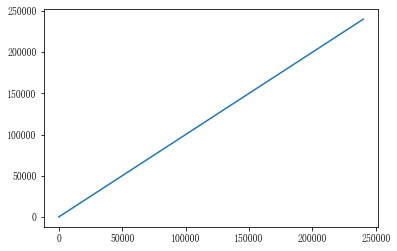

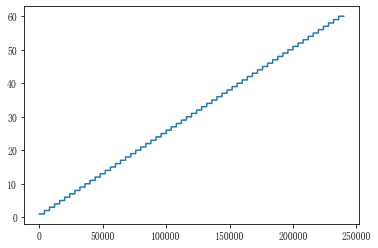

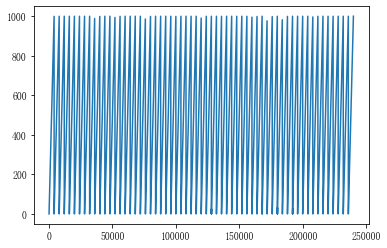

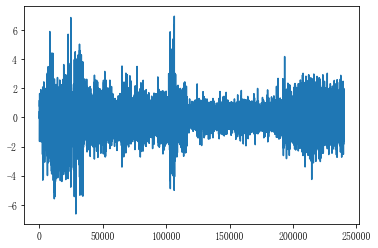

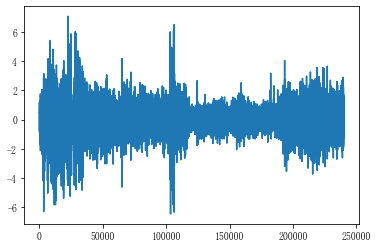

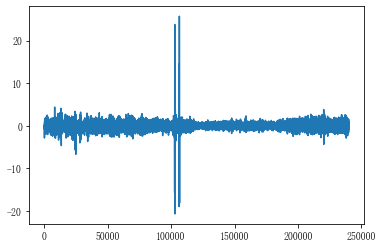

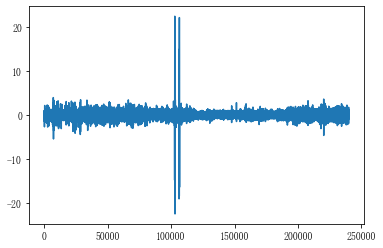

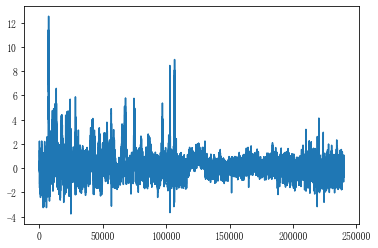

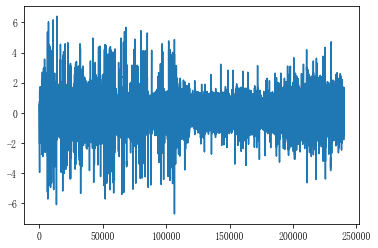

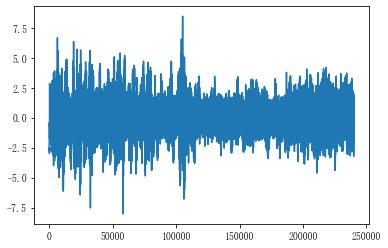

In [13]:
# 转置数据矩阵便于绘图
fact_tran_data = fact_data.T

for column in fact_tran_data:
    plt.plot(column)
    plt.show()

In [14]:
# 删除前三列数据，只保留用于后期数据分析的数据
fact_data = np.delete(fact_data,0,axis=1)
fact_data = np.delete(fact_data,0,axis=1)
fact_data = np.delete(fact_data,0,axis=1)

In [15]:
# 根据轨道动态几何尺寸容许偏差管理值设置阈值
for m in range(240000):
    if fact_data[m,0]>6:
        fact_data[m,0]=6
        print("校正左高低偏差完成！\t")
    if fact_data[m,1]>6:
        fact_data[m,1]=6
        print("校正右高低偏差完成！\t")
    if fact_data[m,2]>5:
        fact_data[m,2]=5
        print("校正左轨向上偏差完成！\t")
    if fact_data[m,2]<-5:
        fact_data[m,2]=-5
        print("校正左轨向下偏差完成！\t")
    if fact_data[m,3]>5:
        fact_data[m,3]=5
        print("校正右轨向偏差完成！\t")
    if fact_data[m,3]<-5:
        fact_data[m,3]=-5
        print("校正右轨向下偏差完成！\t")
    if fact_data[m,4]>6:
        fact_data[m,4]=6
        print("校正轨距上偏差完成！\t")
    if fact_data[m,4]<-4:
        fact_data[m,4]=-4
        print("校正轨距下偏差完成！\t")
    if fact_data[m,5]>6:
        fact_data[m,5]=6
        print("校正水平偏差完成！\t")
    if fact_data[m,6]>5:
        fact_data[m,6]=5
        print("校正三角坑偏差完成！\t")

校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正三角坑偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距上偏差完成！	
校正轨距

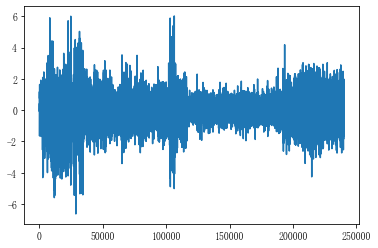

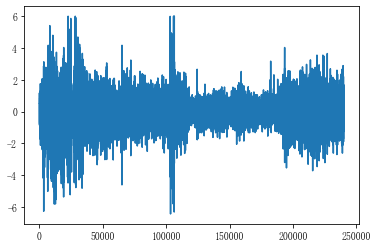

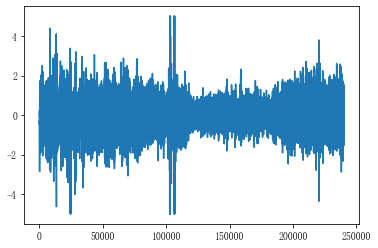

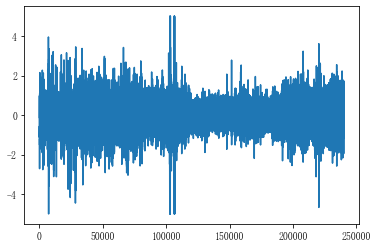

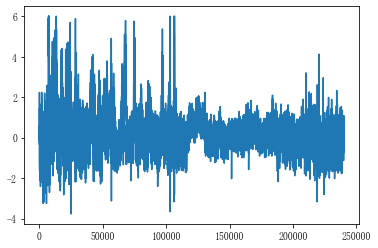

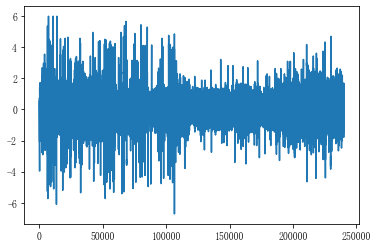

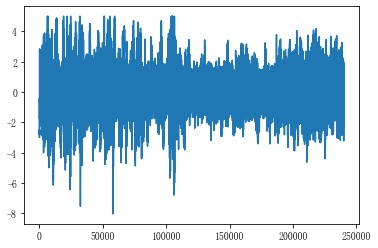

In [16]:
# 绘制异常值更改后的波动图
fact_tran_data = fact_data.T

for column in fact_tran_data:
    plt.plot(column)
    plt.show()

# 2、皮尔森相关性分析

## 2.1 异常值去除前相关性分析

In [17]:
# 分别定义7列数据
l_hl = use_data[:,3]
r_hl = use_data[:,4]
l_td = use_data[:,5]
r_td = use_data[:,6]
tdistance = use_data[:,7]
ho = use_data[:,8]
tp = use_data[:,9]

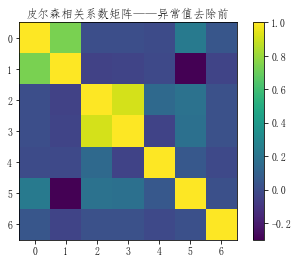

In [18]:
# 绘制皮尔森相关系数矩阵并可视化
correlation_coefficient = np.array([l_hl,r_hl,l_td,r_td,tdistance,ho,tp])
i =  np.corrcoef(correlation_coefficient)

plt.imshow(i)
plt.colorbar()
plt.title("皮尔森相关系数矩阵——异常值去除前")
plt.show()

## 2.2 异常值去除后相关性分析

In [19]:
# 分别定义7列数据
l_hl = fact_tran_data[:,0]
r_hl = fact_tran_data[:,1]
l_td = fact_tran_data[:,2]
r_td = fact_tran_data[:,3]
tdistance = fact_tran_data[:,4]
ho = fact_tran_data[:,5]
tp = fact_tran_data[:,6]

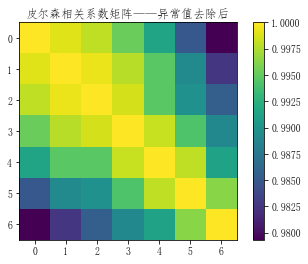

In [20]:
# 绘制皮尔森相关系数矩阵并可视化
correlation_coefficient = np.array([l_hl,r_hl,l_td,r_td,tdistance,ho,tp])
i =  np.corrcoef(correlation_coefficient)

plt.imshow(i)
plt.colorbar()
plt.title("皮尔森相关系数矩阵——异常值去除后")
plt.show()

# 3、数据划分（训练集与测试集）

In [21]:
# 将240000个数据点划分为300个单元，每个单元（200m）包含800个数据点
x = fact_data[:]
res = np.vsplit(x, 300) 

In [22]:
# 定义轨道质量指数（TQI）计算函数
import math
def TQI(input_data):
    sum_data = np.sum(input_data,axis=0)
    average_data = sum_data/input_data.shape[0]
    standard_data = 0
    square_sum = 0
    standard = 0
    for m in range(input_data.shape[1]):
        for n in range(input_data.shape[0]):
            square_sum += input_data[n,m]**2
        standard = math.sqrt(square_sum/n - average_data[m]**2)
        standard_data += standard
    return standard_data
    print(standard_data)
    print(type(standard_data))

In [23]:
# 计算出所有300个TQI，并放到一维数组中
tqi_summary = np.zeros((1,300),dtype=float)
for i in range(300):
    block = np.zeros((800,7),dtype=float)
    block += res[i]
    print("The " + str(i) + "'s shape is " + str(block.shape))
    tqi = TQI(block)
    m=i//300
    n=i%300
    tqi_summary[m,n] += tqi
    
print(tqi_summary.shape)
tqi_summary

The 0's shape is (800, 7)
The 1's shape is (800, 7)
The 2's shape is (800, 7)
The 3's shape is (800, 7)
The 4's shape is (800, 7)
The 5's shape is (800, 7)
The 6's shape is (800, 7)
The 7's shape is (800, 7)
The 8's shape is (800, 7)
The 9's shape is (800, 7)
The 10's shape is (800, 7)
The 11's shape is (800, 7)
The 12's shape is (800, 7)
The 13's shape is (800, 7)
The 14's shape is (800, 7)
The 15's shape is (800, 7)
The 16's shape is (800, 7)
The 17's shape is (800, 7)
The 18's shape is (800, 7)
The 19's shape is (800, 7)
The 20's shape is (800, 7)
The 21's shape is (800, 7)
The 22's shape is (800, 7)
The 23's shape is (800, 7)
The 24's shape is (800, 7)
The 25's shape is (800, 7)
The 26's shape is (800, 7)
The 27's shape is (800, 7)
The 28's shape is (800, 7)
The 29's shape is (800, 7)
The 30's shape is (800, 7)
The 31's shape is (800, 7)
The 32's shape is (800, 7)
The 33's shape is (800, 7)
The 34's shape is (800, 7)
The 35's shape is (800, 7)
The 36's shape is (800, 7)
The 37's sh

array([[ 9.89348513,  7.99600076,  9.05484968, 11.86142419, 14.66534802,
        11.33619528, 10.05474636, 11.90959319, 19.94638588, 19.01743143,
        13.43988082, 15.30768498, 19.14889977, 19.80508301, 21.09817371,
        18.24281538, 18.804088  , 16.1428278 , 13.0557397 , 10.72456631,
        15.85201149, 17.85611964, 15.8664338 , 15.08025754, 13.42439449,
        13.36324673, 11.41963837, 12.85080931, 16.50830462, 11.25087146,
        21.88876319, 12.0786522 ,  6.51745953,  8.68474412, 11.83816873,
        21.53286981, 11.5348353 , 12.21195784,  8.73742126, 18.13138988,
        14.2558999 , 15.37752605, 16.65845042,  9.42030182,  8.98262169,
         9.62663459, 11.32666626,  9.41808048,  8.8977715 ,  9.9938416 ,
        12.39147975, 11.20860215, 11.67838114,  9.35718947, 11.69306444,
        10.04624755, 11.26146218, 11.44270094, 11.26042009, 10.95267447,
        11.03959874,  9.68343493,  9.71127465, 11.29040988, 15.72275997,
        11.62474275, 12.83919188, 11.00830466, 11.0

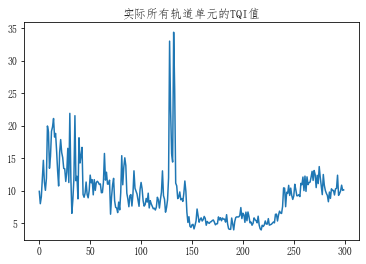

In [24]:
# 绘制出60km的TQI值变化曲线
plt.plot(tqi_summary[0,:])
plt.title("实际所有轨道单元的TQI值")
plt.show()

In [25]:
# 保存训练集数据到txt文件
train_data = tqi_summary[0,0:295]
train_data = train_data.reshape(295,1)

np.savetxt("tqi.txt", train_data,fmt='%f',delimiter='\t')

# 4、灰色预测模型

## 4.1 模型搭建

In [26]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['font.sans-serif'] = ['FangSong'] # 指定默认字体
matplotlib.rcParams['axes.unicode_minus'] = False    # 解决保存图像是负号'-'显示为方块的问题

In [27]:
class GrayForecast():
    #初始化
    def __init__(self, data, datacolumn=None):
        if isinstance(data, pd.core.frame.DataFrame):
            self.data=data
            try:
                self.data.columns = ['数据']
            except:
                if not datacolumn:
                    raise Exception('您传入的dataframe不止一列')
                else:
                    self.data = pd.DataFrame(data[datacolumn])
                    self.data.columns=['数据']
        elif isinstance(data, pd.core.series.Series):
            self.data = pd.DataFrame(data, columns=['数据'])
        else:
            self.data = pd.DataFrame(data, columns=['数据'])

        self.forecast_list = self.data.copy()

        if datacolumn:
            self.datacolumn = datacolumn
        else:
            self.datacolumn = None
    #级比校验
    def level_check(self):
            # 数据级比校验
        n = len(self.data)
        lambda_k = np.zeros(n-1)
        for i in range(n-1):
            lambda_k[i] = self.data.ix[i]["数据"]/self.data.ix[i+1]["数据"]
            if lambda_k[i] < np.exp(-2/(n+1)) or lambda_k[i] > np.exp(2/(n+2)):
                flag = False
        else:
            flag = True

        self.lambda_k = lambda_k

        if not flag:
            print("级比校验失败，请对X(0)做平移变换")
            return False
        else:
            print("级比校验成功，请继续")
            return True
    #GM(1,1)建模
    def GM_11_build_model(self, forecast=5):
        if forecast > len(self.data):
            raise Exception('您的数据行不够')
        X_0 = np.array(self.forecast_list['数据'].tail(forecast))
        #       1-AGO
        X_1 = np.zeros(X_0.shape)
        for i in range(X_0.shape[0]):
            X_1[i] = np.sum(X_0[0:i+1])
        #       紧邻均值生成序列
        Z_1 = np.zeros(X_1.shape[0]-1)
        for i in range(1, X_1.shape[0]):
            Z_1[i-1] = -0.5*(X_1[i]+X_1[i-1])

        B = np.append(np.array(np.mat(Z_1).T), np.ones(Z_1.shape).reshape((Z_1.shape[0], 1)), axis=1)
        Yn = X_0[1:].reshape((X_0[1:].shape[0], 1))

        B = np.mat(B)
        Yn = np.mat(Yn)
        a_ = (B.T*B)**-1 * B.T * Yn

        a, b = np.array(a_.T)[0]

        X_ = np.zeros(X_0.shape[0])
        def f(k):
            return (X_0[0]-b/a)*(1-np.exp(a))*np.exp(-a*(k))

        self.forecast_list.loc[len(self.forecast_list)] = f(X_.shape[0])
    #预测
    def forecast(self, time=5, forecast_data_len=5):
        for i in range(time):
            self.GM_11_build_model(forecast=forecast_data_len)
    #打印日志
    def log(self):
        res = self.forecast_list.copy()
        if self.datacolumn:
            res.columns = [self.datacolumn]
        return res
    #重置
    def reset(self):
        self.forecast_list = self.data.copy()
    #作图
    def plot(self):
        self.forecast_list.plot()
        if self.datacolumn:
            plt.ylabel(self.datacolumn)
            plt.legend([self.datacolumn])

## 4.2 模型训练与预测

In [28]:
# 读取训练集并进行模型训练
df = pd.read_csv("tqi.txt", header=None, encoding="utf8")

In [29]:
# 使用模型对最后1km的TQI进行预测
gf = GrayForecast(df)
gf.forecast(5)
gf.log()

,数据
0,9.893485
1,7.996001
2,9.054850
3,11.861424
4,14.665348
...,...
295,10.339481
296,9.839676
297,8.842598
298,9.150337


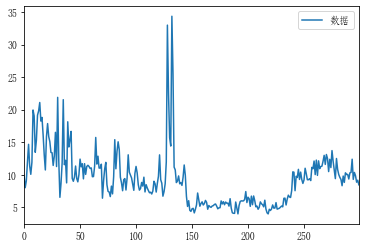

In [30]:
# 绘制预测的TQI变化曲线
gf.plot()

## 4.3 模型检验与讨论

In [31]:
predict_values = np.array([10.339481,9.839676,8.842598,9.150337,8.436515]).reshape(5,1)  # 预测值
truth_values = tqi_summary[0,295:3000].reshape(5,1)                                      # 实际值

stack = np.hstack([truth_values,predict_values])

abso_difference = predict_values - truth_values                                          # 绝对误差
rela_difference = (predict_values - truth_values)/truth_values                           # 相对误差

stack = np.hstack([stack,abso_difference])
stack = np.hstack([stack,rela_difference])

print(stack)

[[ 9.56913914 10.339481    0.77034186  0.08050273]
 [ 9.97725002  9.839676   -0.13757402 -0.01378877]
 [10.84361686  8.842598   -2.00101886 -0.18453426]
 [10.04795441  9.150337   -0.89761741 -0.08933335]
 [10.12017118  8.436515   -1.68365618 -0.16636637]]
